# Whelks and lobsters -- context operator

## The system

In [1]:
%display latex

In [2]:
import sys, os, warnings
from contextlib import contextmanager

@contextmanager
def suppress_stdout():
    with open(os.devnull, "w") as devnull:
        old_stdout = sys.stdout
        sys.stdout = devnull
        try:  
            yield
        finally:
            sys.stdout = old_stdout


@contextmanager
def suppress_warnings():
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        yield

In [3]:
from lbuc import *

In [4]:
from lbuc.bondcalculus import *

In [5]:
!ls

'BC 2.ipynb'
'BC 3.ipynb'
'BC 4 nullcline.ipynb'
'BC 4.ipynb'
'Lotka-Volterra role reversal.ipynb'
'Reach context tree bug.ipynb'
'Sensitivity analysis.ipynb'
 Untitled.ipynb
'W&L context operator context signal test.ipynb'
'W&L physical subdivision.ipynb'
'WandL context mask tidied.ipynb'
'Whelks and lobsters -- Split context, New Context Signals.ipynb'
'Whelks and lobsters -- Split context-Copy2 copy.ipynb'
'Whelks and lobsters -- Split context-Copy2.ipynb'
'Whelks and lobsters context 2.ipynb'
'Whelks and lobsters context 4.ipynb'
'Whelks and lobsters context signals with masks 2 BC.ipynb'
'Whelks and lobsters context signals with masks 2.ipynb'
'Whelks and lobsters context signals with masks.ipynb'
 WhelksAndLobsters.bond
 cysignals_crash_logs
 phase-portrait.pdf
 phase_portrait.pdf
 whelks-jump.pdf
 whelks-phase-portrait.pdf


In [6]:
m = BondModel("WhelksAndLobsters.bond")

Running cmd: 'load "WhelksAndLobsters.bond"' ...


In [7]:
p = m.process("[1, 1.2] Whelk || [4, 6] Lobster with network N(0.8, 0.6, 0.3, 0.05, 2)")

In [8]:
!cat /tmp/bond-sage-script-90g57kp5.py

from sage.all import *
import sympy as sym

R, x = PolynomialRing(RIF, 2, ', '.join(map('x{}'.format, range(0, 2)))).objgens()
xsr = [SR.var(str(x1)) for x1 in x]
for v in xsr:
   assume(v, 'real')
xsym = sym.var(','.join(map('x{}'.format, range(0,2))))
asym = sym.var(','.join(map('a{}'.format, range(0,8))))
y0 = [RIF('[4.00000000000000000000 .. 6.00000000000000000000]'), RIF('[0.99999999999999990000 .. 1.20000000000000020000]')]
ysymraw = [(x0) * ((a0) * ((x1) * (2.0))) + (x0) * (((x1) * (-1)) * ((x1) * (2.0))) + (-1) * ((x0) * (a1)) + (-1) * ((x0) * ((x0) * (a2))), (x1) * (a3) + ((x1) * (-1)) * ((x1) * (a4)) + (-1) * ((x0) * ((a5) * ((x1) * (a6)))) + (-1) * ((x0) * (((x1) * (-1)) * ((x1) * (a7))))]
ysym = [sym.simplify(y1) for y1 in ysymraw]
ysr = [y1._sage_().substitute(a0=RIF('[0.79999999999999990000 .. 0.80000000000000000000]'),a1=RIF('[0.04999999999999999600 .. 0.05000000000000000000]'),a2=RIF('[0.04999999999999999600 .. 0.05000000000000000000]'),a3=RIF('[0.60000000000000000000 .

In [9]:
s = p.as_system

Running cmd: 'savesage "[1, 1.2] Whelk || [4, 6] Lobster with network N(0.8, 0.6, 0.3, 0.05, 2)" "/tmp/bond-sage-script-1399hli8.py"' ...


In [10]:
u = (x, y) = reversed(s.x)

In [11]:
vf = vector(reversed(s.y))

In [12]:
vf

(0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1, -2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0)

In [13]:
x2 = s.y0

In [14]:
v2 = [RIF(1,1.2), RIF(4,6)]

In [15]:
v3 = v2 # [RIF(1,1.1), RIF(4,5)]

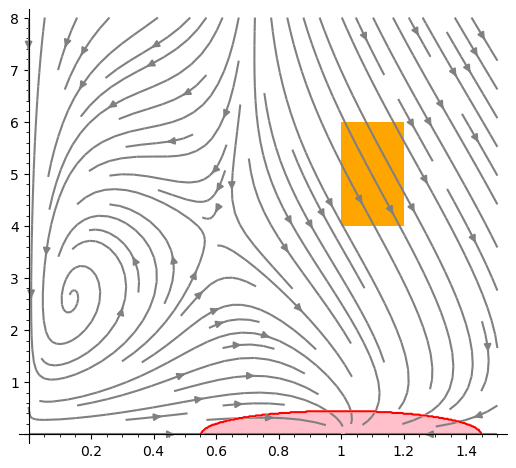

In [16]:
p = streamline_plot(tuple(vf),(x,0,1.5),(y,0,8), color='grey')\
    + polygon([(v3[0].lower(), v3[1].lower()),
               (v3[0].lower(), v3[1].upper()),
               (v3[0].upper(), v3[1].upper()),
               (v3[0].upper(), v3[1].lower())],
              color='orange')\
    + region_plot((lambda x, y: (x - 1)^2 + y^2 - 0.2 < 0),
                  (x, 0, 1.5),
                  (y, 0, 8),
                  incol='pink', plot_points=500, bordercol='red')
p.set_aspect_ratio(1/6)
p.show()

## Simple signal

In [17]:
P = Atomic((var("Whelk") - 1)^2 + var("Lobster")^2 > 0.2)

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 96 flowpipes in 0.4246368940221146 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9ea6c884c0>, 0, symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000009], [[0.10000000000000000 .. 5.2020000000000009]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.67 seconds
roots = [[0.72899770431682586 .. 2.3396961789293478], [2.4054956907643583 .. 2.4223569572167918]]
domain = [0.0000000000000000 .. 5.2020000000000009]
roots = [[0.728

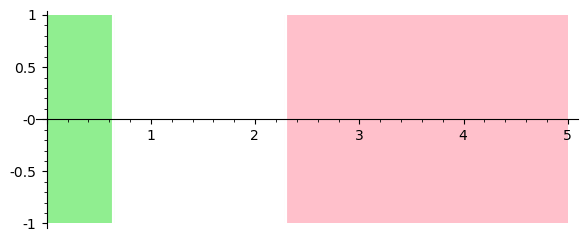

In [18]:
sig = F(RIF(0.1, 0.2), P).signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
sig.plot()

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9ea6c8c080>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachT

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9494069953384487 .. 2.2661983340704222]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9494069953384487 .. 2.2661983340704222]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9494069953384487 .. 2.2661983340704222]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8494069953384487], True), ([2.1661983340704225 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8494069953384487], True), ([2.1661983340704225 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(L

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1587772868248296 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(L

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8705153484842031 .. 2.2286463799981329]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8705153484842031 .. 2.2286463799981329]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8705153484842031 .. 2.2286463799981329]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7705153484842032], True), ([2.1286463799981332 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7705153484842032], True), ([2.1286463799981332 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(L

top-level root detection: 1 items in 0.27 seconds
roots = [[1.0315253521806846 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 0.93152535218068456], True), ([2.0341310578689117 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.93152535218068456], True), ([2.0341310578689117 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lob

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1587772868248296 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.0587772868248296], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None


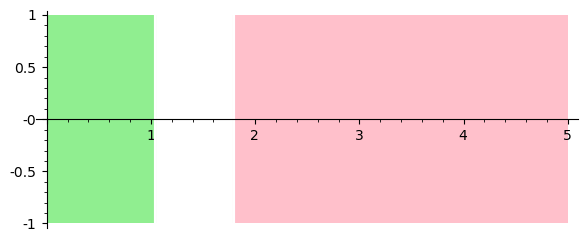

In [19]:
csig = F(RIF(0.1, 0.2), P).context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=False,
)
sig = csig.refined_signal(2)
sig.plot()

 ==> creating ContextSignal with coord=(0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9ea6c8c080>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000

top-level root detection: 1 items in 0.11 seconds
roots = [[2.1614685741463399 .. 2.2519068338220683]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1614685741463399 .. 2.2519068338220683]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1614685741463399 .. 2.2519068338220683]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 2.0614685741463399], True), ([2.1519068338220685 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 2.0614685741463399], True), ([2.1519068338220685 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1), signal = functools.partial(<bound method Atomic.signal

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7f9eac81eee0>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9ea42322e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.13 seconds
roots = [[2.0548085727428171 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0548085727428171 .. 2.1341310578689115]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0548085727428171 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 3), signal = Signal([0.000000000000

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1930448360153089 .. 2.2803632825986280]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1930448360153089 .. 2.2803632825986280]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1930448360153089 .. 2.2803632825986280]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 2.0930448360153089], True), ([2.1803632825986283 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 2.0930448360153089], True), ([2.1803632825986283 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0471902398546721 .. 2.1257407905277779]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0471902398546721 .. 2.1257407905277779]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0471902398546721 .. 2.1257407905277779]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9471902398546722], True), ([2.0257407905277782 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9471902398546722], True), ([2.0257407905277782 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0105630356917001 .. 2.0852810870606962]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0105630356917001 .. 2.0852810870606962]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0105630356917001 .. 2.0852810870606962]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9105630356917001], True), ([1.9852810870606962 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9105630356917001], True), ([1.9852810870606962 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.8547619678722160 .. 1.9881667162404884]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8547619678722160 .. 1.9881667162404884]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8547619678722160 .. 1.9881667162404884]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7547619678722160], True), ([1.8881667162404884 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7547619678722160], True), ([1.8881667162404884 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8656264921058800 .. 1.9356538584611305]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8656264921058800 .. 1.9356538584611305]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8656264921058800 .. 1.9356538584611305]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7656264921058800], True), ([1.8356538584611306 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7656264921058800], True), ([1.8356538584611306 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9793891515582444 .. 1.9796869398670812], [1.9897095252275771 .. 2.0607851017773320]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9793891515582444 .. 1.9796869398670812], 
 [1.9897095252275771 .. 2.0607851017773320]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9793891515582444 .. 1.9796869398670812], 
 [1.9897095252275771 .. 2.0607851017773320]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8897095252275771], True), ([1.9607851017773321 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8897095252275771], True), ([1.9607851017773321 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8615035536434236 .. 1.9268030027877024]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8615035536434236 .. 1.9268030027877024]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8615035536434236 .. 1.9268030027877024]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7615035536434236], True), ([1.8268030027877024 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7615035536434236], True), ([1.8268030027877024 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1277608180800435 .. 2.2079610713214795]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1277608180800435 .. 2.2079610713214795]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1277608180800435 .. 2.2079610713214795]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 2.0277608180800435], True), ([2.1079610713214798 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 2.0277608180800435], True), ([2.1079610713214798 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0658884603314033 .. 2.1389662344800003]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0658884603314033 .. 2.1389662344800003]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0658884603314033 .. 2.1389662344800003]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9658884603314033], True), ([2.0389662344800005 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9658884603314033], True), ([2.0389662344800005 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[2.0963751839227260 .. 2.1739902515011429]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0963751839227260 .. 2.1739902515011429]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0963751839227260 .. 2.1739902515011429]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9963751839227260], True), ([2.0739902515011432 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9963751839227260], True), ([2.0739902515011432 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9989522920201279 .. 2.0687679132801958]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9989522920201279 .. 2.0687679132801958]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9989522920201279 .. 2.0687679132801958]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8989522920201279], True), ([1.9687679132801958 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8989522920201279], True), ([1.9687679132801958 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9635869410043484 .. 2.0363931390636641]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9635869410043484 .. 2.0363931390636641]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9635869410043484 .. 2.0363931390636641]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8635869410043485], True), ([1.9363931390636641 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8635869410043485], True), ([1.9363931390636641 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8492067871580484 .. 1.9080079448807422]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8492067871580484 .. 1.9080079448807422]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8492067871580484 .. 1.9080079448807422]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7492067871580484], True), ([1.8080079448807422 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7492067871580484], True), ([1.8080079448807422 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9124252498978500 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9124252498978500 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9124252498978500 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8124252498978500], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8124252498978500], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.09 seconds
roots = [[1.8710138965367126 .. 1.9373430351685519]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8710138965367126 .. 1.9373430351685519]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8710138965367126 .. 1.9373430351685519]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7710138965367126], True), ([1.8373430351685520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7710138965367126], True), ([1.8373430351685520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7391392813548451 .. 1.9133456329283912]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7391392813548451 .. 1.9133456329283912]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7391392813548451 .. 1.9133456329283912]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6391392813548452], True), ([1.8133456329283912 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6391392813548452], True), ([1.8133456329283912 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.14 seconds
roots = [[1.7702662631334185 .. 1.8651762123742528]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7702662631334185 .. 1.8651762123742528]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7702662631334185 .. 1.8651762123742528]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6702662631334185], True), ([1.7651762123742529 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6702662631334185], True), ([1.7651762123742529 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7200261379561341 .. 1.8278610600184242]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7200261379561341 .. 1.8278610600184242]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7200261379561341 .. 1.8278610600184242]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6200261379561341], True), ([1.7278610600184243 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6200261379561341], True), ([1.7278610600184243 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7660010619884987 .. 1.8558226361713373]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7660010619884987 .. 1.8558226361713373]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7660010619884987 .. 1.8558226361713373]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6660010619884987], True), ([1.7558226361713373 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6660010619884987], True), ([1.7558226361713373 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7182401184227873 .. 1.8199051884609192]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7182401184227873 .. 1.8199051884609192]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7182401184227873 .. 1.8199051884609192]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6182401184227873], True), ([1.7199051884609193 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6182401184227873], True), ([1.7199051884609193 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4652994902405060 .. 1.8653151699565092]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4652994902405060 .. 1.8653151699565092]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4652994902405060 .. 1.8653151699565092]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3652994902405061], True), ([1.7653151699565092 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3652994902405061], True), ([1.7653151699565092 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5569778066566752 .. 1.7631804251262296]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5569778066566752 .. 1.7631804251262296]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5569778066566752 .. 1.7631804251262296]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4569778066566753], True), ([1.6631804251262296 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4569778066566753], True), ([1.6631804251262296 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5026757636070520 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5026757636070520 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5026757636070520 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4026757636070520], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4026757636070520], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5581116122210090 .. 1.7539970165719772]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5581116122210090 .. 1.7539970165719772]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5581116122210090 .. 1.7539970165719772]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4581116122210090], True), ([1.6539970165719772 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4581116122210090], True), ([1.6539970165719772 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.5051663810151127 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5051663810151127 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5051663810151127 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4051663810151128], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4051663810151128], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.7319844872224554 .. 1.8948508409921403]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7319844872224554 .. 1.8948508409921403]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7319844872224554 .. 1.8948508409921403]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6319844872224554], True), ([1.7948508409921404 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6319844872224554], True), ([1.7948508409921404 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7469134878743797 .. 1.7476146363331520], [1.7478753040169963 .. 1.8295778341151543]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7469134878743797 .. 1.7476146363331520], 
 [1.7478753040169963 .. 1.8295778341151543]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7469134878743797 .. 1.7476146363331520], 
 [1.7478753040169963 .. 1.8295778341151543]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6478753040169963], True), ([1.7295778341151544 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6478753040169963], True), ([1.7295778341151544 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7058228879798531 .. 1.8152546225117879]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7058228879798531 .. 1.8152546225117879]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7058228879798531 .. 1.8152546225117879]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6058228879798531], True), ([1.7152546225117879 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6058228879798531], True), ([1.7152546225117879 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7417538194084678 .. 1.8207129856350966]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7417538194084678 .. 1.8207129856350966]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7417538194084678 .. 1.8207129856350966]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6417538194084678], True), ([1.7207129856350966 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6417538194084678], True), ([1.7207129856350966 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6998050870239898 .. 1.8050931360840592]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6998050870239898 .. 1.8050931360840592]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6998050870239898 .. 1.8050931360840592]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5998050870239898], True), ([1.7050931360840593 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5998050870239898], True), ([1.7050931360840593 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.16 seconds
roots = [[1.4749384277545525 .. 1.4818331808097201], [1.4841733295430792 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4749384277545525 .. 1.4818331808097201], 
 [1.4841733295430792 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4749384277545525 .. 1.4818331808097201], 
 [1.4841733295430792 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3841733295430792], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3841733295430792], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_t

top-level root detection: 1 items in 0.16 seconds
roots = [[1.5578204701071403 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5578204701071403 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5578204701071403 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4578204701071403], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4578204701071403], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5075507745456915 .. 1.7463312924678920]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5075507745456915 .. 1.7463312924678920]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5075507745456915 .. 1.7463312924678920]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4075507745456915], True), ([1.6463312924678921 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4075507745456915], True), ([1.6463312924678921 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5567112025543872 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5567112025543872 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5567112025543872 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4567112025543872], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4567112025543872], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5073394340214698 .. 1.7350417241983296]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5073394340214698 .. 1.7350417241983296]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5073394340214698 .. 1.7350417241983296]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4073394340214698], True), ([1.6350417241983297 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4073394340214698], True), ([1.6350417241983297 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.12 seconds
roots = [[2.0571498919611772 .. 2.2165040263099641]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0571498919611772 .. 2.2165040263099641]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0571498919611772 .. 2.2165040263099641]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9571498919611772], True), ([2.1165040263099643 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9571498919611772], True), ([2.1165040263099643 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7f9eac81eee0>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9ea4348970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.11 seconds
roots = [[1.9508816705911387 .. 2.1106639654146547]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9508816705911387 .. 2.1106639654146547]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9508816705911387 .. 2.1106639654146547]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1), signal = Signal([0.000000000000000

top-level root detection: 1 items in 0.15 seconds
roots = [[2.0170753428230523 .. 2.1962353240503121]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0170753428230523 .. 2.1962353240503121]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0170753428230523 .. 2.1962353240503121]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9170753428230523], True), ([2.0962353240503124 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9170753428230523], True), ([2.0962353240503124 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9223280172237438 .. 2.0869459844172323]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9223280172237438 .. 2.0869459844172323]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9223280172237438 .. 2.0869459844172323]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8223280172237438], True), ([1.9869459844172323 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8223280172237438], True), ([1.9869459844172323 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8686289379264060 .. 2.0106708521389565]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8686289379264060 .. 2.0106708521389565]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8686289379264060 .. 2.0106708521389565]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7686289379264060], True), ([1.9106708521389565 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7686289379264060], True), ([1.9106708521389565 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8791451297432772 .. 1.9586612433441167]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8791451297432772 .. 1.9586612433441167]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8791451297432772 .. 1.9586612433441167]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7791451297432773], True), ([1.8586612433441167 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7791451297432773], True), ([1.8586612433441167 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8433760725628474 .. 1.9065382239903966]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8433760725628474 .. 1.9065382239903966]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8433760725628474 .. 1.9065382239903966]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7433760725628474], True), ([1.8065382239903966 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7433760725628474], True), ([1.8065382239903966 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8690247854549595 .. 1.9480827125725496]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8690247854549595 .. 1.9480827125725496]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8690247854549595 .. 1.9480827125725496]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7690247854549595], True), ([1.8480827125725496 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7690247854549595], True), ([1.8480827125725496 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7945170613932699 .. 1.8635464547088152]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7945170613932699 .. 1.8635464547088152]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7945170613932699 .. 1.8635464547088152]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6945170613932699], True), ([1.7635464547088153 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6945170613932699], True), ([1.7635464547088153 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 2), signal = functools.partial(<bound method Atomic.sig

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7f9eac81eee0>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9ea40f22e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.17 seconds
roots = [[2.0186904163691354 .. 2.1183431488633305]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0186904163691354 .. 2.1183431488633305]

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9266440759608065 .. 2.0185499007734836]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9266440759608065 .. 2.0185499007734836]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9266440759608065 .. 2.0185499007734836]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8266440759608065], True), ([1.9185499007734836 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8266440759608065], True), ([1.9185499007734836 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0363140730182092 .. 2.1440238725562253]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0363140730182092 .. 2.1440238725562253]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0363140730182092 .. 2.1440238725562253]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9363140730182092], True), ([2.0440238725562256 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.9363140730182092], True), ([2.0440238725562256 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8525831745936158 .. 2.0693195611206559]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8525831745936158 .. 2.0693195611206559]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8525831745936158 .. 2.0693195611206559]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7525831745936158], True), ([1.9693195611206559 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7525831745936158], True), ([1.9693195611206559 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8766147644032746 .. 1.9857163071973183]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8766147644032746 .. 1.9857163071973183]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8766147644032746 .. 1.9857163071973183]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7766147644032746], True), ([1.8857163071973184 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7766147644032746], True), ([1.8857163071973184 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8694477161434444 .. 1.9746663621720014]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8694477161434444 .. 1.9746663621720014]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8694477161434444 .. 1.9746663621720014]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7694477161434444], True), ([1.8746663621720014 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7694477161434444], True), ([1.8746663621720014 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7757393313462306 .. 1.8465656214652713]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7757393313462306 .. 1.8465656214652713]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7757393313462306 .. 1.8465656214652713]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6757393313462306], True), ([1.7465656214652713 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6757393313462306], True), ([1.7465656214652713 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8593438240585777 .. 1.9638225903849552]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8593438240585777 .. 1.9638225903849552]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8593438240585777 .. 1.9638225903849552]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7593438240585777], True), ([1.8638225903849552 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7593438240585777], True), ([1.8638225903849552 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7179271009983383 .. 1.8948508409921403]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7179271009983383 .. 1.8948508409921403]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7179271009983383 .. 1.8948508409921403]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6179271009983383], True), ([1.7948508409921404 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6179271009983383], True), ([1.7948508409921404 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7376760200131258 .. 1.8231022316296249]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7376760200131258 .. 1.8231022316296249]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7376760200131258 .. 1.8231022316296249]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6376760200131258], True), ([1.7231022316296249 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6376760200131258], True), ([1.7231022316296249 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7664037655562920 .. 1.8314293668666933]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7664037655562920 .. 1.8314293668666933]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7664037655562920 .. 1.8314293668666933]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6664037655562920], True), ([1.7314293668666933 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6664037655562920], True), ([1.7314293668666933 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6441656293582989 .. 1.7585698656135287]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6441656293582989 .. 1.7585698656135287]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6441656293582989 .. 1.7585698656135287]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5441656293582989], True), ([1.6585698656135288 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5441656293582989], True), ([1.6585698656135288 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7547298021898760 .. 1.8236982699506390]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7547298021898760 .. 1.8236982699506390]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7547298021898760 .. 1.8236982699506390]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6547298021898760], True), ([1.7236982699506391 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6547298021898760], True), ([1.7236982699506391 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5666528820252254 .. 1.5732552798087876], [1.5751984343793277 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5666528820252254 .. 1.5732552798087876], 
 [1.5751984343793277 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5666528820252254 .. 1.5732552798087876], 
 [1.5751984343793277 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4751984343793277], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4751984343793277], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_t

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6130848215537121 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6130848215537121 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6130848215537121 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5130848215537121], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5130848215537121], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5907253985793619 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5907253985793619 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5907253985793619 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4907253985793619], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4907253985793619], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.14 seconds
roots = [[1.4415633577842585 .. 1.4422565145763576], [1.4510132687082675 .. 1.7066485005041506]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4415633577842585 .. 1.4422565145763576], 
 [1.4510132687082675 .. 1.7066485005041506]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4415633577842585 .. 1.4422565145763576], 
 [1.4510132687082675 .. 1.7066485005041506]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3510132687082675], True), ([1.6066485005041506 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3510132687082675], True), ([1.6066485005041506 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5800920741755555 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5800920741755555 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5800920741755555 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4800920741755555], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4800920741755555], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.2632820429790188 .. 1.2698898155144596], [1.2890579121330436 .. 1.2922298118416325], [1.2993227084236946 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2632820429790188 .. 1.2698898155144596], 
 [1.2890579121330436 .. 1.2922298118416325], 
 [1.2993227084236946 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2632820429790188 .. 1.2698898155144596], 
 [1.2890579121330436 .. 1.2922298118416325], 
 [1.2993227084236946 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.1890579121330436], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3), signal = Signal([0.0000000000000000 .. 5.000000000

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4252011306755076 .. 1.7145661802388009]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4252011306755076 .. 1.7145661802388009]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4252011306755076 .. 1.7145661802388009]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3252011306755076], True), ([1.6145661802388009 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3252011306755076], True), ([1.6145661802388009 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0), signal = functools.partial(<bound method Atomic.signal

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7258592190316814 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7258592190316814 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7258592190316814 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6258592190316815], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6258592190316815], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6064298611942027 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6064298611942027 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6064298611942027 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5064298611942027], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5064298611942027], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 2), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7179122173728333 .. 1.8117342361441847]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7179122173728333 .. 1.8117342361441847]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7179122173728333 .. 1.8117342361441847]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6179122173728334], True), ([1.7117342361441847 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6179122173728334], True), ([1.7117342361441847 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.15 seconds
roots = [[1.5134637178160450 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5134637178160450 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5134637178160450 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4134637178160450], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4134637178160450], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5684429292010844 .. 1.5732552798087876], [1.5733288283056718 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5684429292010844 .. 1.5732552798087876], 
 [1.5733288283056718 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5684429292010844 .. 1.5732552798087876], 
 [1.5733288283056718 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4733288283056719], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4733288283056719], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.15 seconds
roots = [[1.5525286258885810 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5525286258885810 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5525286258885810 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4525286258885811], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4525286258885811], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4029337385535418 .. 1.4062777270914824], [1.4125758723330865 .. 1.7207523832236924]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4029337385535418 .. 1.4062777270914824], 
 [1.4125758723330865 .. 1.7207523832236924]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4029337385535418 .. 1.4062777270914824], 
 [1.4125758723330865 .. 1.7207523832236924]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3125758723330865], True), ([1.6207523832236925 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3125758723330865], True), ([1.6207523832236925 .. 5.0000000000000000], False)], mask=None), r

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5423933547693553 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5423933547693553 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5423933547693553 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4423933547693553], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.4423933547693553], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = functools.partial(<bound method Atomic.sig

top-level root detection: 1 items in 0.13 seconds
roots = [[1.2292716403741343 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2292716403741343 .. 1.8177271147421941]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2292716403741343 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.1292716403741344], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.1292716403741344], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn

top-level root detection: 1 items in 0.16 seconds
roots = [[1.3667728385202149 .. 1.7476146363331520]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3667728385202149 .. 1.7476146363331520]]
seg_domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3667728385202149 .. 1.7476146363331520]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.2667728385202149], True), ([1.6476146363331520 .. 5.0019999999999998], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.2667728385202149], True), ([1.6476146363331520 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None


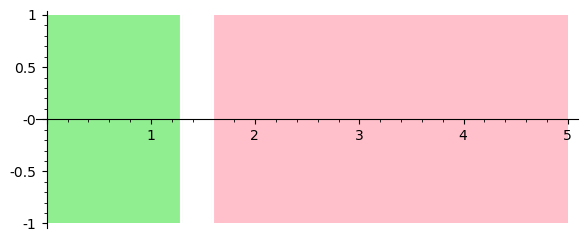

In [20]:
sig = csig.refined_signal(4)
sig.plot()

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 96 flowpipes in 0.4772038510418497 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9ea6c884c0>, 0, symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2000000000000002], [[0.59999999999999997 .. 1.2000000000000002], [3.0999999999999996 .. 4.2000000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.32 seconds
roots = [[0.72899770431682586 .. 1.2000000000000109]]
domain = [0.0000000000000000 .. 5.2020000000000009]
roots = [[0.728

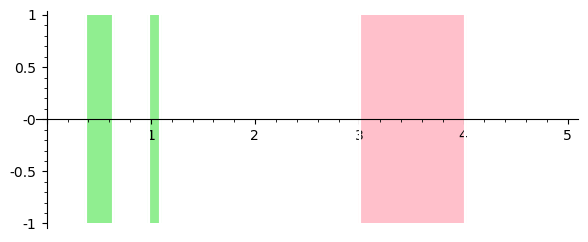

In [21]:
sig = F(RIF(0.1, 0.2), P).signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
    mask=Mask(RIF(0, 5), [RIF(0.5, 1), RIF(3, 4)]),
)
sig.plot()

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 95 flowpipes in 0.3843294370453805 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9ea6c88160>, 0, symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.0020000000000007], [[0.0000000000000000 .. 5.0020000000000007]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.64 seconds
roots = [[0.72899770431682586 .. 2.3396961789293478], [2.4054956907643583 .. 2.4223569572167918]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[0.7289

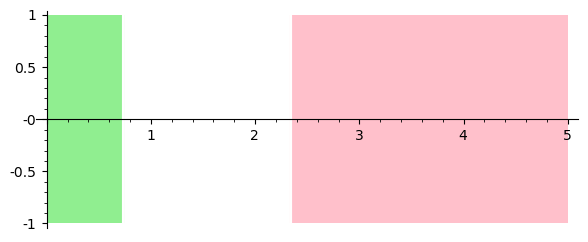

In [22]:
sig = P.signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
sig.plot()

In [23]:
P

Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9ea43737c0>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachT

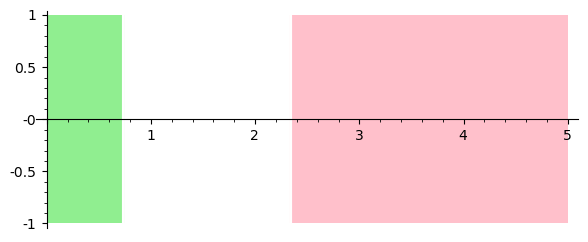

In [24]:
ctx_sig = P.context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9ea43737c0>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9ea4098880>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.

top-level root detection: 1 items in 0.15 seconds
roots = [[1.7938092808537906 .. 2.0598508475266369]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.7938092808537906 .. 2.0598508475266369]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.7938092808537906 .. 2.0598508475266369]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7938092808537907], True), ([2.0598508475266368 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.0010000000000

top-level root detection: 1 items in 0.14 seconds
roots = [[1.1923460266102128 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.1923460266102128 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.1923460266102128 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.1923460266102129], True), ([1.9796869398670811 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.0010000000000

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7434382993839399 .. 1.7476146363331520], [1.7829458826230593 .. 2.1962353240503121]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.7434382993839399 .. 1.7476146363331520], 
 [1.7829458826230593 .. 2.1962353240503121]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.7434382993839399 .. 1.7476146363331520], 
 [1.7829458826230593 .. 2.1962353240503121]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7434382993839400], True), ([1.7476146363331519 .. 1.7829458826230594], True), ([2.1962353240503120 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3), signal = functools.partial(<bound method Atomic.si

top-level root detection: 1 items in 0.16 seconds
roots = [[1.1587772868248296 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
seg_domain = [0.0000000000000000 .. 5.0019999999999998]
roots = [[1.1587772868248296 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.1587772868248297], True), ([1.9796869398670811 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.0000000000000000 .. 5.0000000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000

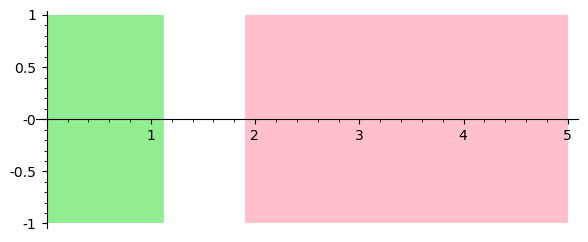

In [25]:
ctx_sig.refined_signal(2).plot()

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9ea42c6780>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachT

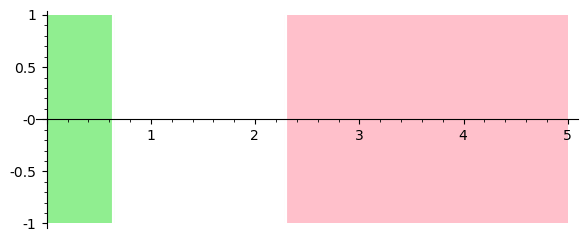

In [26]:
ctx_sig = F(RIF(0.1, 0.2), P).context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.2),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9ea42c6780>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9ea42d4940>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.

top-level root detection: 1 items in 0.20 seconds
roots = [[1.0315253521806846 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.0315253521806846 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 0.93152535218068456], True), ([2.0341310578689117 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.93152535218068456], True), ([2.0341310578689117 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.00000000000000

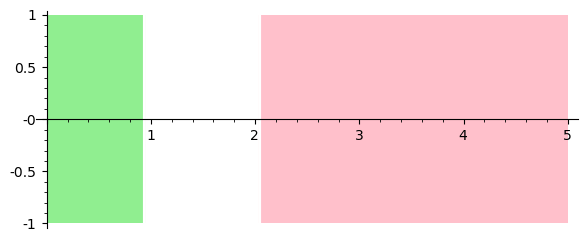

In [27]:
ctx_sig.refined_signal(1).plot()

 ==> creating ContextSignal with coord=(0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9ea42c6780>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9ea44096a0>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 

top-level root detection: 1 items in 0.18 seconds
roots = [[1.7938092808537906 .. 2.0598508475266369]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7938092808537906 .. 2.0598508475266369]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.7938092808537906 .. 2.0598508475266369]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6938092808537906], True), ([1.9598508475266369 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6938092808537906], True), ([1.9598508475266369 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000000000

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8705153484842031 .. 2.2286463799981329]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8705153484842031 .. 2.2286463799981329]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.8705153484842031 .. 2.2286463799981329]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7705153484842032], True), ([2.1286463799981332 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7705153484842032], True), ([2.1286463799981332 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000000000

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5210067644057307 .. 1.5253675136664189], [1.5420056455144943 .. 1.8969970597539152]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5210067644057307 .. 1.5253675136664189], 
 [1.5420056455144943 .. 1.8969970597539152]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.5210067644057307 .. 1.5253675136664189], 
 [1.5420056455144943 .. 1.8969970597539152]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.4420056455144943], True), ([1.7969970597539153 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.44200564551449

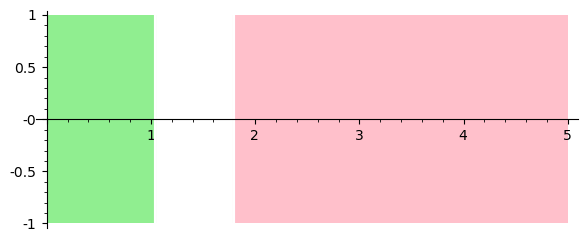

In [28]:
ctx_sig.refined_signal(2).plot()

 ==> creating ContextSignal with coord=(0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.200000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9ea42c6780>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9e97e45eb0>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000

top-level root detection: 1 items in 0.14 seconds
roots = [[2.0230384317242866 .. 2.0263467942482989], [2.0279366837973880 .. 2.1904513946812814]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0230384317242866 .. 2.0263467942482989], 
 [2.0279366837973880 .. 2.1904513946812814]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[2.0230384317242866 .. 2.0263467942482989], 
 [2.0279366837973880 .. 2.1904513946812814]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.9279366837973880], True), ([2.0904513946812817 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.92793668

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8453710646460455 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8453710646460455 .. 1.9796869398670812]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.8453710646460455 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7453710646460455], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7453710646460455], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9724534089065968 .. 1.9796869398670812], [1.9940326001405757 .. 2.1341310578689115]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9724534089065968 .. 1.9796869398670812], 
 [1.9940326001405757 .. 2.1341310578689115]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.9724534089065968 .. 1.9796869398670812], 
 [1.9940326001405757 .. 2.1341310578689115]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8940326001405757], True), ([2.0341310578689117 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.89403260

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8115091937157896 .. 1.9440443480703609]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8115091937157896 .. 1.9440443480703609]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.8115091937157896 .. 1.9440443480703609]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7115091937157896], True), ([1.8440443480703609 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7115091937157896], True), ([1.8440443480703609 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6136025393349557 .. 1.8698203113228507]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6136025393349557 .. 1.8698203113228507]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.6136025393349557 .. 1.8698203113228507]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5136025393349557], True), ([1.7698203113228507 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5136025393349557], True), ([1.7698203113228507 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.13 seconds
roots = [[1.2633883083755312 .. 1.2698898155144596], [1.2905842098463022 .. 1.2922298118416325], [1.3054060191187095 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2633883083755312 .. 1.2698898155144596], 
 [1.2905842098463022 .. 1.2922298118416325], 
 [1.3054060191187095 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.2633883083755312 .. 1.2698898155144596], 
 [1.2905842098463022 .. 1.2922298118416325], 
 [1.3054060191187095 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.1905842098463022], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> crea

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6096225115215880 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6096225115215880 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.6096225115215880 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5096225115215880], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5096225115215880], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.14 seconds
roots = [[1.3343314242940507 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3343314242940507 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.3343314242940507 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.2343314242940507], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.2343314242940507], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9223280172237438 .. 2.0869459844172323]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9223280172237438 .. 2.0869459844172323]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.9223280172237438 .. 2.0869459844172323]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.8223280172237438], True), ([1.9869459844172323 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.8223280172237438], True), ([1.9869459844172323 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7727504331546246 .. 1.9017678109651062]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7727504331546246 .. 1.9017678109651062]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.7727504331546246 .. 1.9017678109651062]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6727504331546246], True), ([1.8017678109651062 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6727504331546246], True), ([1.8017678109651062 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8031240929411975 .. 1.9796869398670812]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8031240929411975 .. 1.9796869398670812]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.8031240929411975 .. 1.9796869398670812]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.7031240929411975], True), ([1.8796869398670812 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.7031240929411975], True), ([1.8796869398670812 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7147829558370213 .. 1.8602515837932341]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7147829558370213 .. 1.8602515837932341]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.7147829558370213 .. 1.8602515837932341]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.6147829558370213], True), ([1.7602515837932342 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.6147829558370213], True), ([1.7602515837932342 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4706896407950682 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4706896407950682 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.4706896407950682 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3706896407950682], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.3706896407950682], True), ([1.7177271147421941 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6625901218448249 .. 1.8349868855689380]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6625901218448249 .. 1.8349868855689380]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.6625901218448249 .. 1.8349868855689380]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.5625901218448249], True), ([1.7349868855689380 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.5625901218448249], True), ([1.7349868855689380 .. 5.0000000000000000], False)], mask=Mask([0.0000000000000000 .. 5.0000000000000000], [[0.000000

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4038756174820459 .. 1.4062777270914824], [1.4216651133194717 .. 1.8177271147421941]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4038756174820459 .. 1.4062777270914824], 
 [1.4216651133194717 .. 1.8177271147421941]]
seg_domain = [0.10000000000000000 .. 5.2020000000000000]
roots = [[1.4038756174820459 .. 1.4062777270914824], 
 [1.4216651133194717 .. 1.8177271147421941]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 0), signal = Signal([0.0000000000000000 .. 5.1019999999999995], [([0.0000000000000000 .. 1.3216651133194717], True), ([1.7177271147421941 .. 5.0019999999999998], False)], mask=Mask([0.0000000000000000 .. 5.1019999999999995], [[0.0000000000000000 .. 5.0019999999999998]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 1.32166511

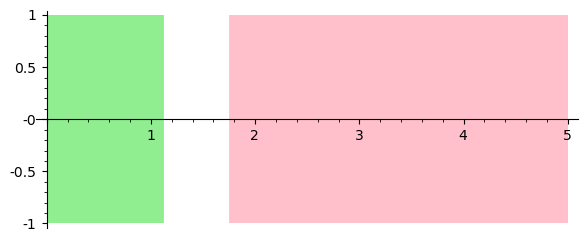

In [29]:
ctx_sig.refined_signal(3).plot()

phi variables sfs = {x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Whelk > 1.15000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9e97e0a600>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7f9e97ca0

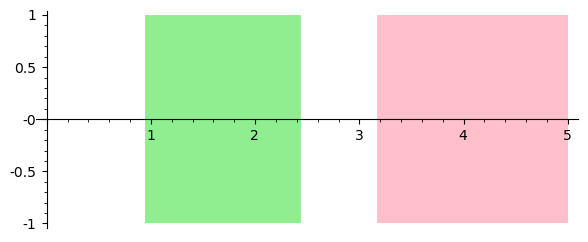

In [30]:
ctx_sig = Atomic(var("Whelk") > 1.15).context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

In [31]:
prop = (F(RIF(0.1, 0.2), P) & Atomic(var("Whelk") > 1.15))
prop

And([F([0.10000000000000000 .. 0.20000000000000002], Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)), Atomic(Whelk > 1.15000000000000)])

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function base_context_signal.<locals>.<lambda> at 0x7f9e97c28af0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9e97cf21f0>
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, inst

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


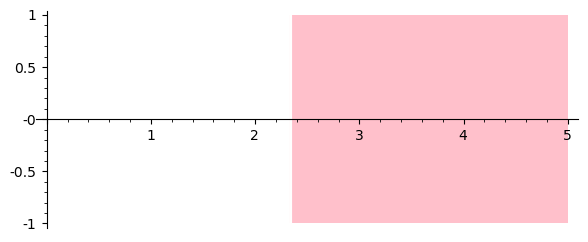

In [32]:
ctx_sig = prop.context_signal_for_system(
    s, 5, order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

 ==> creating ContextSignal with coord=(0,), signal = <function base_context_signal.<locals>.<lambda> at 0x7f9e97c28af0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9e97c76490>
 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9e97ed82c0>, print_timings=False, unpreconditioning_order=5, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9e97b5fa90>
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.18682009633911412]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.0000000000000000 .. 0.18682009633911412]]
seg_domain = [0.0000000000000000 .. 2.0599348131745492]
roots = [[0.0000000000000000 .. 0.18682009633911412]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.18682009633911411 .. 0.95356689920617455], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.18682009633911411 .. 0.95356689920617455], True), ([2.0599348131745491 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = <function base_context_signal.<locals>.<lambda> at 0x7f9e97

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.11567776027118346]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.0000000000000000 .. 0.11567776027118346]]
seg_domain = [0.0000000000000000 .. 2.0599348131745492]
roots = [[0.0000000000000000 .. 0.11567776027118346]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.11567776027118345 .. 0.92751246630496387], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.11567776027118345 .. 0.92751246630496387], True), ([2.0599348131745491 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = <function base_context_signal.<locals>.<lambda> at 0x7f9e

top-level root detection: 1 items in 0.02 seconds
roots = [[0.25019700201163680 .. 0.60659470338002486]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.25019700201163680 .. 0.60659470338002486]]
seg_domain = [0.0000000000000000 .. 2.1821632186714602]
roots = [[0.25019700201163680 .. 0.60659470338002486]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.25019700201163681], False), ([0.60659470338002485 .. 1.8715019515650123], True), ([2.1821632186714601 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.25019700201163681], False), ([0.60659470338002485 .. 1.8715019515650123], True), ([2.1821632186714601 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None


top-level root detection: 1 items in 0.08 seconds
roots = [[2.1267390283011859 .. 2.3124551167059391]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1267390283011859 .. 2.3124551167059391]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1267390283011859 .. 2.3124551167059391]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0267390283011860], True), ([2.2124551167059394 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0267390283011860], True), ([2.2124551167059394 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.09 seconds
roots = [[2.2203584344888525 .. 2.3324693273034951]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2203584344888525 .. 2.3324693273034951]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2203584344888525 .. 2.3324693273034951]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1203584344888525], True), ([2.2324693273034954 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1203584344888525], True), ([2.2324693273034954 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.08 seconds
roots = [[2.2136442267983711 .. 2.3163133579180047]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2136442267983711 .. 2.3163133579180047]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2136442267983711 .. 2.3163133579180047]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1136442267983711], True), ([2.2163133579180049 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1136442267983711], True), ([2.2163133579180049 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1120525438718842 .. 2.2010781068192685]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1120525438718842 .. 2.2010781068192685]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1120525438718842 .. 2.2010781068192685]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0120525438718842], True), ([2.1010781068192687 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0120525438718842], True), ([2.1010781068192687 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1031837939149924 .. 2.1884784921354888]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1031837939149924 .. 2.1884784921354888]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1031837939149924 .. 2.1884784921354888]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0031837939149924], True), ([2.0884784921354890 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0031837939149924], True), ([2.0884784921354890 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.07 seconds
roots = [[2.2060646727033210 .. 2.3000387577206128]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.2060646727033210 .. 2.3000387577206128]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.2060646727033210 .. 2.3000387577206128]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.1060646727033210], True), ([2.2000387577206130 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.1060646727033210], True), ([2.2000387577206130 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1953615874556540 .. 2.2842573142784795]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1953615874556540 .. 2.2842573142784795]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1953615874556540 .. 2.2842573142784795]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0953615874556540], True), ([2.1842573142784798 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0953615874556540], True), ([2.1842573142784798 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.01 seconds
roots = [[0.36845645029483609 .. 0.47679958776869353]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.36845645029483609 .. 0.47679958776869353]]
seg_domain = [0.0000000000000000 .. 2.0754565157503593]
roots = [[0.36845645029483609 .. 0.47679958776869353]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.36845645029483610], False), ([0.47679958776869352 .. 1.9930735970601310], True), ([2.0754565157503592 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.36845645029483610], False), ([0.47679958776869352 .. 1.9930735970601310], True), ([2.0754565157503592 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ct

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9364809072282680 .. 2.0881329478474751]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9364809072282680 .. 2.0881329478474751]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9364809072282680 .. 2.0881329478474751]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8364809072282680], True), ([1.9881329478474751 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8364809072282680], True), ([1.9881329478474751 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9299369506319683 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9299369506319683 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9299369506319683 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8299369506319683], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8299369506319683], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.17 seconds
roots = [[2.0052632049156438 .. 2.0845804069335748]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0052632049156438 .. 2.0845804069335748]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0052632049156438 .. 2.0845804069335748]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9052632049156438], True), ([1.9845804069335748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9052632049156438], True), ([1.9845804069335748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.9995451258217702 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9995451258217702 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9995451258217702 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8995451258217702], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8995451258217702], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9177336507352658 .. 1.9904171914366447]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9177336507352658 .. 1.9904171914366447]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9177336507352658 .. 1.9904171914366447]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8177336507352658], True), ([1.8904171914366447 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8177336507352658], True), ([1.8904171914366447 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.17 seconds
roots = [[1.9120813334625683 .. 1.9806069685572048]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9120813334625683 .. 1.9806069685572048]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9120813334625683 .. 1.9806069685572048]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8120813334625683], True), ([1.8806069685572048 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8120813334625683], True), ([1.8806069685572048 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9935692377407570 .. 2.0766977299734318]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9935692377407570 .. 2.0766977299734318]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9935692377407570 .. 2.0766977299734318]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8935692377407570], True), ([1.9766977299734318 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8935692377407570], True), ([1.9766977299734318 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9874210569513754 .. 2.0640233314827277]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9874210569513754 .. 2.0640233314827277]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9874210569513754 .. 2.0640233314827277]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8874210569513755], True), ([1.9640233314827277 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8874210569513755], True), ([1.9640233314827277 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9053767917636477 .. 1.9711911527484616]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9053767917636477 .. 1.9711911527484616]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9053767917636477 .. 1.9711911527484616]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8053767917636477], True), ([1.8711911527484617 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8053767917636477], True), ([1.8711911527484617 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8977288956678759 .. 1.9612143370915037]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8977288956678759 .. 1.9612143370915037]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8977288956678759 .. 1.9612143370915037]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7977288956678759], True), ([1.8612143370915037 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7977288956678759], True), ([1.8612143370915037 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1082014008492810 .. 2.2726047043847726]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1082014008492810 .. 2.2726047043847726]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1082014008492810 .. 2.2726047043847726]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0082014008492811], True), ([2.1726047043847729 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0082014008492811], True), ([2.1726047043847729 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[2.0761853527103304 .. 2.2453281791739746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0761853527103304 .. 2.2453281791739746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0761853527103304 .. 2.2453281791739746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9761853527103304], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9761853527103304], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1819621704564662 .. 2.2683759523692833]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1819621704564662 .. 2.2683759523692833]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1819621704564662 .. 2.2683759523692833]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0819621704564662], True), ([2.1683759523692835 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0819621704564662], True), ([2.1683759523692835 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.1675274448203842 .. 2.2525903878816110]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1675274448203842 .. 2.2525903878816110]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1675274448203842 .. 2.2525903878816110]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0675274448203842], True), ([2.1525903878816112 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0675274448203842], True), ([2.1525903878816112 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0726398586411654 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0726398586411654 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0726398586411654 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9726398586411654], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9726398586411654], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0631403230311078 .. 2.1498086321112715]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0631403230311078 .. 2.1498086321112715]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0631403230311078 .. 2.1498086321112715]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9631403230311078], True), ([2.0498086321112718 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9631403230311078], True), ([2.0498086321112718 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.08 seconds
roots = [[2.1547548811945107 .. 2.2453281791739746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1547548811945107 .. 2.2453281791739746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1547548811945107 .. 2.2453281791739746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0547548811945107], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0547548811945107], True), ([2.1453281791739748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[2.1427013508955945 .. 2.2391547961770196]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.1427013508955945 .. 2.2391547961770196]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.1427013508955945 .. 2.2391547961770196]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 2.0427013508955945], True), ([2.1391547961770198 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 2.0427013508955945], True), ([2.1391547961770198 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

res = b''
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7f9ea6c88b80>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 2.0344395593968648]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9ea427fac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.32154769592660037 .. 0.39991751686292843]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.32154769592660037 .. 0.39991751686292843]]
seg_domain = [0.0000000000000000 .. 2.0344395593968648]
roots = [[0.32154769592660037 .. 0.39991751686292843]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([

top-level root detection: 1 items in 0.11 seconds
roots = [[2.0453079343671229 .. 2.1193188998600415]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0453079343671229 .. 2.1193188998600415]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0453079343671229 .. 2.1193188998600415]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9453079343671230], True), ([2.0193188998600417 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9453079343671230], True), ([2.0193188998600417 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9202468123199025 .. 2.0579415730736522]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9202468123199025 .. 2.0579415730736522]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9202468123199025 .. 2.0579415730736522]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8202468123199025], True), ([1.9579415730736522 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8202468123199025], True), ([1.9579415730736522 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9021354579165103 .. 2.0282605918368280]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9021354579165103 .. 2.0282605918368280]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9021354579165103 .. 2.0282605918368280]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8021354579165104], True), ([1.9282605918368280 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8021354579165104], True), ([1.9282605918368280 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9805999666569245 .. 2.0511677869153915]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9805999666569245 .. 2.0511677869153915]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9805999666569245 .. 2.0511677869153915]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8805999666569245], True), ([1.9511677869153916 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8805999666569245], True), ([1.9511677869153916 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.9707420385997294 .. 2.0387966073100921]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9707420385997294 .. 2.0387966073100921]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9707420385997294 .. 2.0387966073100921]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8707420385997294], True), ([1.9387966073100921 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8707420385997294], True), ([1.9387966073100921 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8889529153681785 .. 1.9510825263757264]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8889529153681785 .. 1.9510825263757264]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8889529153681785 .. 1.9510825263757264]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7889529153681785], True), ([1.8510825263757264 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7889529153681785], True), ([1.8510825263757264 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8817657439475907 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8817657439475907 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8817657439475907 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7817657439475907], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7817657439475907], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.9597786822984988 .. 2.0262885281135992]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9597786822984988 .. 2.0262885281135992]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9597786822984988 .. 2.0262885281135992]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8597786822984988], True), ([1.9262885281135992 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8597786822984988], True), ([1.9262885281135992 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.16 seconds
roots = [[1.9481177810492353 .. 2.0138714620129071]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9481177810492353 .. 2.0138714620129071]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9481177810492353 .. 2.0138714620129071]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8481177810492353], True), ([1.9138714620129071 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8481177810492353], True), ([1.9138714620129071 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8742881156790818 .. 1.9393611235291318]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8742881156790818 .. 1.9393611235291318]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8742881156790818 .. 1.9393611235291318]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7742881156790818], True), ([1.8393611235291318 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7742881156790818], True), ([1.8393611235291318 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.17 seconds
roots = [[1.8673439265145383 .. 1.9279277478880692]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8673439265145383 .. 1.9279277478880692]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8673439265145383 .. 1.9279277478880692]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7673439265145384], True), ([1.8279277478880693 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7673439265145384], True), ([1.8279277478880693 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.27 seconds
roots = [[1.5190726670739937 .. 1.5209519216602428], [1.5508397892025977 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5190726670739937 .. 1.5209519216602428], 
 [1.5508397892025977 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5190726670739937 .. 1.5209519216602428], 
 [1.5508397892025977 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4508397892025978], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.45083978920259

top-level root detection: 1 items in 0.19 seconds
roots = [[1.2075578469760097 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2075578469760097 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2075578469760097 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1075578469760097], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.1075578469760097], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9e97ec86d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.19 seconds
roots = [[1.6126275858553422 .. 1.8836031159580114]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6126275858553422 .. 1.8836031159580114]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6126275858553422 .. 1.8836031159580114]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5126275858553422], True), ([1.7836031159580114 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1), signal = Signal([0.000

top-level root detection: 1 items in 0.15 seconds
roots = [[1.8249398631325302 .. 1.8969664208217312]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8249398631325302 .. 1.8969664208217312]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8249398631325302 .. 1.8969664208217312]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7249398631325302], True), ([1.7969664208217313 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7249398631325302], True), ([1.7969664208217313 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.15 seconds
roots = [[1.8219607404940758 .. 1.8893731062702395]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8219607404940758 .. 1.8893731062702395]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8219607404940758 .. 1.8893731062702395]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7219607404940758], True), ([1.7893731062702395 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7219607404940758], True), ([1.7893731062702395 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7f9ea6c88b80>, , symbolic_composition=True, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9ea4324970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.13 seconds
roots = [[1.7261850874736885 .. 1.8362267711486727]]
domain = [0.

top-level root detection: 1 items in 0.16 seconds
roots = [[1.6735241233531128 .. 1.8031698232827283]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6735241233531128 .. 1.8031698232827283]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6735241233531128 .. 1.8031698232827283]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5735241233531128], True), ([1.7031698232827283 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5735241233531128], True), ([1.7031698232827283 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7700627540864799 .. 1.8518012482376263]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7700627540864799 .. 1.8518012482376263]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7700627540864799 .. 1.8518012482376263]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6700627540864799], True), ([1.7518012482376263 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6700627540864799], True), ([1.7518012482376263 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.16 seconds
roots = [[1.7665338956811849 .. 1.8434115465999697]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7665338956811849 .. 1.8434115465999697]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7665338956811849 .. 1.8434115465999697]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6665338956811849], True), ([1.7434115465999697 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6665338956811849], True), ([1.7434115465999697 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.15 seconds
roots = [[1.6679344271162248 .. 1.6681523846319555], [1.6718788617668260 .. 1.7949173328188013]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6679344271162248 .. 1.6681523846319555], 
 [1.6718788617668260 .. 1.7949173328188013]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6679344271162248 .. 1.6681523846319555], 
 [1.6718788617668260 .. 1.7949173328188013]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5718788617668261], True), ([1.6949173328188014 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.57

top-level root detection: 1 items in 0.16 seconds
roots = [[1.6661241228441223 .. 1.6681523846319555], [1.6692420535773644 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6661241228441223 .. 1.6681523846319555], 
 [1.6692420535773644 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6661241228441223 .. 1.6681523846319555], 
 [1.6692420535773644 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5692420535773644], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.56

top-level root detection: 1 items in 0.16 seconds
roots = [[1.4626655702270239 .. 1.4714810888685397], [1.4721020415854353 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4626655702270239 .. 1.4714810888685397], 
 [1.4721020415854353 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4626655702270239 .. 1.4714810888685397], 
 [1.4721020415854353 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3721020415854353], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.37210204

top-level root detection: 1 items in 0.20 seconds
roots = [[1.6111404530754296 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6111404530754296 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6111404530754296 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5111404530754296], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5111404530754296], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6120816547302827 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6120816547302827 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6120816547302827 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5120816547302827], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5120816547302827], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.19 seconds
roots = [[1.4953557461741717 .. 1.7514051337863037]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4953557461741717 .. 1.7514051337863037]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4953557461741717 .. 1.7514051337863037]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3953557461741717], True), ([1.6514051337863038 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3953557461741717], True), ([1.6514051337863038 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4986264611151194 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4986264611151194 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4986264611151194 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3986264611151194], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3986264611151194], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5564585133732582 .. 1.7557704541454558]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5564585133732582 .. 1.7557704541454558]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5564585133732582 .. 1.7557704541454558]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4564585133732582], True), ([1.6557704541454558 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4564585133732582], True), ([1.6557704541454558 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5569623526041218 .. 1.7468047425644145]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5569623526041218 .. 1.7468047425644145]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5569623526041218 .. 1.7468047425644145]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4569623526041218], True), ([1.6468047425644145 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4569623526041218], True), ([1.6468047425644145 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9e97fa46d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.20 seconds
roots = [[1.4238491057700735 .. 1.4265076045124459], [1.4404907870918532 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4238491057700735 .. 1.4265076045124459], 
 [1.4404907870918532 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4238491057700735 .. 1.4265076045124459], 
 [1.4404907870918532 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.02 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3404907870918533], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_ma

=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9e97fa4eb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.18 seconds
roots = [[1.7386747754371556 .. 1.8892493329455107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7386747754371556 .. 1.8892493329455107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7386747754371556 .. 1.8892493329455107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6386747754371556], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000

top-level root detection: 1 items in 0.21 seconds
roots = [[1.6107116878676972 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6107116878676972 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6107116878676972 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5107116878676972], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5107116878676972], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7611236200496793 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7611236200496793 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7611236200496793 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6611236200496793], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6611236200496793], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.7549073472100242 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7549073472100242 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7549073472100242 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6549073472100242], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6549073472100242], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.22 seconds
roots = [[1.6635626385971369 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6635626385971369 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6635626385971369 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5635626385971369], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5635626385971369], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.16 seconds
roots = [[1.6609355145735298 .. 1.7840026318696148]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6609355145735298 .. 1.7840026318696148]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6609355145735298 .. 1.7840026318696148]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5609355145735298], True), ([1.6840026318696148 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5609355145735298], True), ([1.6840026318696148 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.7481103728417779 .. 1.8269707891009746]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7481103728417779 .. 1.8269707891009746]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7481103728417779 .. 1.8269707891009746]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6481103728417779], True), ([1.7269707891009746 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6481103728417779], True), ([1.7269707891009746 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.15 seconds
roots = [[1.7402660885626619 .. 1.8175081041591273]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7402660885626619 .. 1.8175081041591273]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7402660885626619 .. 1.8175081041591273]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6402660885626619], True), ([1.7175081041591273 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6402660885626619], True), ([1.7175081041591273 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6578526285845538 .. 1.7747752183819097]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6578526285845538 .. 1.7747752183819097]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6578526285845538 .. 1.7747752183819097]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5578526285845538], True), ([1.6747752183819097 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5578526285845538], True), ([1.6747752183819097 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6543723876340310 .. 1.7657960634598189]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6543723876340310 .. 1.7657960634598189]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6543723876340310 .. 1.7657960634598189]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5543723876340310], True), ([1.6657960634598190 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5543723876340310], True), ([1.6657960634598190 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.15 seconds
roots = [[1.3082151394723258 .. 1.3146652053999961], [1.3181178645338393 .. 1.8311520467472724]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3082151394723258 .. 1.3146652053999961], 
 [1.3181178645338393 .. 1.8311520467472724]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3082151394723258 .. 1.3146652053999961], 
 [1.3181178645338393 .. 1.8311520467472724]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2181178645338394], True), ([1.7311520467472725 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.21811786

top-level root detection: 1 items in 0.15 seconds
roots = [[1.3331507693733841 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3331507693733841 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3331507693733841 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2331507693733841], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.2331507693733841], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5568800062557406 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5568800062557406 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5568800062557406 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4568800062557406], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4568800062557406], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5562759157706378 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5562759157706378 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5562759157706378 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4562759157706378], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4562759157706378], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4493999463203517 .. 1.7217941998116573]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4493999463203517 .. 1.7217941998116573]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4493999463203517 .. 1.7217941998116573]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3493999463203517], True), ([1.6217941998116573 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3493999463203517], True), ([1.6217941998116573 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4506636437435393 .. 1.7119061260415305]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4506636437435393 .. 1.7119061260415305]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4506636437435393 .. 1.7119061260415305]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3506636437435394], True), ([1.6119061260415306 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3506636437435394], True), ([1.6119061260415306 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5552084001677954 .. 1.7405761834498730]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5552084001677954 .. 1.7405761834498730]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5552084001677954 .. 1.7405761834498730]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4552084001677955], True), ([1.6405761834498731 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4552084001677955], True), ([1.6405761834498731 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5537303155126231 .. 1.7315091590816299]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5537303155126231 .. 1.7315091590816299]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5537303155126231 .. 1.7315091590816299]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4537303155126232], True), ([1.6315091590816299 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4537303155126232], True), ([1.6315091590816299 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4514868167174521 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4514868167174521 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4514868167174521 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3514868167174521], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3514868167174521], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4519151278224928 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4519151278224928 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4519151278224928 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3519151278224928], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3519151278224928], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.7407895833673612 .. 1.7442041432368050], [1.7525481771106843 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7407895833673612 .. 1.7442041432368050], 
 [1.7525481771106843 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7407895833673612 .. 1.7442041432368050], 
 [1.7525481771106843 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6525481771106843], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.65254817711068

top-level root detection: 1 items in 0.13 seconds
roots = [[1.6295523670103906 .. 1.6352295454090771], [1.6639445939962054 .. 1.6681523846319555], [1.6748810749990297 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6295523670103906 .. 1.6352295454090771], 
 [1.6639445939962054 .. 1.6681523846319555], 
 [1.6748810749990297 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6295523670103906 .. 1.6352295454090771], 
 [1.6639445939962054 .. 1.6681523846319555], 
 [1.6748810749990297 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5639445939962054], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creatin

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9594461877156628 .. 2.1088356091213974]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9594461877156628 .. 2.1088356091213974]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9594461877156628 .. 2.1088356091213974]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8594461877156628], True), ([2.0088356091213976 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8594461877156628], True), ([2.0088356091213976 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.9266156491171788 .. 2.0852140854249908]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9266156491171788 .. 2.0852140854249908]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9266156491171788 .. 2.0852140854249908]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8266156491171788], True), ([1.9852140854249908 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8266156491171788], True), ([1.9852140854249908 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0758974820218085 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0758974820218085 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0758974820218085 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9758974820218085], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9758974820218085], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

roots = [[2.0622046495366892 .. 2.1582336270578036]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9622046495366892], True), ([2.0582336270578038 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9622046495366892], True), ([2.0582336270578038 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Whelk > 1.15000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, 

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9840335687001413 .. 2.0580509009583743]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9840335687001413 .. 2.0580509009583743]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9840335687001413 .. 2.0580509009583743]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8840335687001413], True), ([1.9580509009583744 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8840335687001413], True), ([1.9580509009583744 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9708839193606733 .. 2.0459509976652353]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9708839193606733 .. 2.0459509976652353]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9708839193606733 .. 2.0459509976652353]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8708839193606733], True), ([1.9459509976652353 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8708839193606733], True), ([1.9459509976652353 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

roots = [[0.32884714632289041 .. 0.39998670621773375]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.32884714632289042], False), ([0.39998670621773374 .. 1.9505459291587593], True), ([2.0441135009395967 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.32884714632289042], False), ([0.39998670621773374 .. 1.9505459291587593], True), ([2.0441135009395967 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = <function base_context_signal.<locals>.<lambda> at 0x7f9e97c28af0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9e97f03ee0>
 ==> creating ContextSignal with coord=(

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9987944921028621 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9987944921028621 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9987944921028621 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8987944921028622], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8987944921028622], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9871709803645232 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9871709803645232 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9871709803645232 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8871709803645232], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8871709803645232], True), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.8740687595573957 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8740687595573957 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8740687595573957 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7740687595573957], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7740687595573957], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8487605282021490 .. 2.0046712402672991]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8487605282021490 .. 2.0046712402672991]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8487605282021490 .. 2.0046712402672991]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7487605282021491], True), ([1.9046712402672991 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7487605282021491], True), ([1.9046712402672991 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9366761809661046 .. 2.0117314506962068]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9366761809661046 .. 2.0117314506962068]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9366761809661046 .. 2.0117314506962068]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8366761809661046], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8366761809661046], True), ([1.9117314506962068 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9262571499005864 .. 2.0021964283819998]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9262571499005864 .. 2.0021964283819998]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9262571499005864 .. 2.0021964283819998]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8262571499005865], True), ([1.9021964283819998 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8262571499005865], True), ([1.9021964283819998 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.8574443370572060 .. 1.9167918026642493]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8574443370572060 .. 1.9167918026642493]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8574443370572060 .. 1.9167918026642493]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7574443370572060], True), ([1.8167918026642493 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7574443370572060], True), ([1.8167918026642493 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.8453225313770806 .. 1.9074207935540635]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8453225313770806 .. 1.9074207935540635]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8453225313770806 .. 1.9074207935540635]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7453225313770806], True), ([1.8074207935540635 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7453225313770806], True), ([1.8074207935540635 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9152648307209627 .. 1.9909809556991854]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9152648307209627 .. 1.9909809556991854]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9152648307209627 .. 1.9909809556991854]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8152648307209627], True), ([1.8909809556991854 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8152648307209627], True), ([1.8909809556991854 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9005892552045968 .. 1.9795850398958264]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9005892552045968 .. 1.9795850398958264]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9005892552045968 .. 1.9795850398958264]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8005892552045968], True), ([1.8795850398958264 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8005892552045968], True), ([1.8795850398958264 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.15 seconds
roots = [[1.8328549016443980 .. 1.8981550091575437]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8328549016443980 .. 1.8981550091575437]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8328549016443980 .. 1.8981550091575437]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7328549016443980], True), ([1.7981550091575437 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7328549016443980], True), ([1.7981550091575437 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8226167179822572 .. 1.8892493329455107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8226167179822572 .. 1.8892493329455107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8226167179822572 .. 1.8892493329455107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7226167179822572], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7226167179822572], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9809207958079575 .. 2.1794550845928354]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9809207958079575 .. 2.1794550845928354]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9809207958079575 .. 2.1794550845928354]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8809207958079575], True), ([2.0794550845928356 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8809207958079575], True), ([2.0794550845928356 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9319791166332906 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9319791166332906 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9319791166332906 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8319791166332907], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8319791166332907], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.08 seconds
roots = [[2.0636567709472477 .. 2.1649487050456138]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0636567709472477 .. 2.1649487050456138]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0636567709472477 .. 2.1649487050456138]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9636567709472477], True), ([2.0649487050456141 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9636567709472477], True), ([2.0649487050456141 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0511804636593553 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0511804636593553 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0511804636593553 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9511804636593553], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9511804636593553], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9738490654025209 .. 2.0719118673868798]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9738490654025209 .. 2.0719118673868798]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9738490654025209 .. 2.0719118673868798]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8738490654025209], True), ([1.9719118673868798 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8738490654025209], True), ([1.9719118673868798 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[1.9562345421174964 .. 2.0594109401708032]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9562345421174964 .. 2.0594109401708032]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9562345421174964 .. 2.0594109401708032]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8562345421174964], True), ([1.9594109401708033 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8562345421174964], True), ([1.9594109401708033 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.09 seconds
roots = [[2.0336111459117982 .. 2.1599348131745489]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[2.0336111459117982 .. 2.1599348131745489]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[2.0336111459117982 .. 2.1599348131745489]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.9336111459117982], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.9336111459117982], True), ([2.0599348131745491 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.01 seconds
roots = [[0.32684605344497075 .. 0.39380389893759011]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.32684605344497075 .. 0.39380389893759011]]
seg_domain = [0.0000000000000000 .. 2.0474391112852862]
roots = [[0.32684605344497075 .. 0.39380389893759011]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.32684605344497076], False), ([0.39380389893759010 .. 1.9125909261758994], True), ([2.0474391112852861 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.32684605344497076], False), ([0.39380389893759010 .. 1.9125909261758994], True), ([2.0474391112852861 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ct

top-level root detection: 1 items in 0.10 seconds
roots = [[1.9262517347794836 .. 2.0358463711540323]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.9262517347794836 .. 2.0358463711540323]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.9262517347794836 .. 2.0358463711540323]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.8262517347794836], True), ([1.9358463711540323 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.8262517347794836], True), ([1.9358463711540323 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8178413829607500 .. 1.9846837050389159]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8178413829607500 .. 1.9846837050389159]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8178413829607500 .. 1.9846837050389159]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7178413829607500], True), ([1.8846837050389160 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7178413829607500], True), ([1.8846837050389160 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7803422079208326 .. 1.9672491816599860]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7803422079208326 .. 1.9672491816599860]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7803422079208326 .. 1.9672491816599860]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6803422079208326], True), ([1.8672491816599861 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6803422079208326], True), ([1.8672491816599861 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8852113535532957 .. 1.9693414732655577]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8852113535532957 .. 1.9693414732655577]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8852113535532957 .. 1.9693414732655577]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7852113535532957], True), ([1.8693414732655577 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7852113535532957], True), ([1.8693414732655577 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8735071119586159 .. 1.9589679770360494]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8735071119586159 .. 1.9589679770360494]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8735071119586159 .. 1.9589679770360494]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7735071119586159], True), ([1.8589679770360494 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7735071119586159], True), ([1.8589679770360494 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8135209480556706 .. 1.8892493329455107]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8135209480556706 .. 1.8892493329455107]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8135209480556706 .. 1.8892493329455107]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7135209480556706], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7135209480556706], True), ([1.7892493329455108 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8012193396419080 .. 1.8817027360301620]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8012193396419080 .. 1.8817027360301620]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8012193396419080 .. 1.8817027360301620]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7012193396419080], True), ([1.7817027360301620 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7012193396419080], True), ([1.7817027360301620 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8630846234764468 .. 1.9489205027204280]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8630846234764468 .. 1.9489205027204280]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8630846234764468 .. 1.9489205027204280]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7630846234764468], True), ([1.8489205027204280 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7630846234764468], True), ([1.8489205027204280 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.8476552320686689 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.8476552320686689 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.8476552320686689 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.7476552320686690], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.7476552320686690], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7865314612672942 .. 1.8729582217892576]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7865314612672942 .. 1.8729582217892576]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7865314612672942 .. 1.8729582217892576]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6865314612672942], True), ([1.7729582217892576 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6865314612672942], True), ([1.7729582217892576 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7759559853927116 .. 1.8643986326684555]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7759559853927116 .. 1.8643986326684555]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7759559853927116 .. 1.8643986326684555]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6759559853927116], True), ([1.7643986326684555 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6759559853927116], True), ([1.7643986326684555 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5146908294557674 .. 1.5209519216602428], [1.5365568220836709 .. 1.9038444116115958]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5146908294557674 .. 1.5209519216602428], 
 [1.5365568220836709 .. 1.9038444116115958]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5146908294557674 .. 1.5209519216602428], 
 [1.5365568220836709 .. 1.9038444116115958]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4365568220836709], True), ([1.8038444116115959 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.43655682208367

top-level root detection: 1 items in 0.17 seconds
roots = [[1.1484310893994829 .. 1.9475741509220326]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1484310893994829 .. 1.9475741509220326]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.1484310893994829 .. 1.9475741509220326]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.0484310893994829], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.0484310893994829], True), ([1.8475741509220326 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6011717885188803 .. 1.8218968493573438]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6011717885188803 .. 1.8218968493573438]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6011717885188803 .. 1.8218968493573438]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5011717885188803], True), ([1.7218968493573438 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5011717885188803], True), ([1.7218968493573438 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5646725931461180 .. 1.8138479289019376]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5646725931461180 .. 1.8138479289019376]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5646725931461180 .. 1.8138479289019376]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4646725931461180], True), ([1.7138479289019377 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4646725931461180], True), ([1.7138479289019377 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7340349642257266 .. 1.8100048093059394]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7340349642257266 .. 1.8100048093059394]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7340349642257266 .. 1.8100048093059394]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6340349642257266], True), ([1.7100048093059394 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6340349642257266], True), ([1.7100048093059394 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7269020812178184 .. 1.8030139754701995]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7269020812178184 .. 1.8030139754701995]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7269020812178184 .. 1.8030139754701995]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6269020812178184], True), ([1.7030139754701996 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6269020812178184], True), ([1.7030139754701996 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.10 seconds
roots = [[1.6350792044245605 .. 1.6352295454090771], [1.6491031219484584 .. 1.7596045876659037]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6350792044245605 .. 1.6352295454090771], 
 [1.6491031219484584 .. 1.7596045876659037]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6350792044245605 .. 1.6352295454090771], 
 [1.6491031219484584 .. 1.7596045876659037]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5491031219484584], True), ([1.6596045876659037 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.54

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6274937809894272 .. 1.6352295454090771], [1.6399129984542939 .. 1.7544716881679135]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6274937809894272 .. 1.6352295454090771], 
 [1.6399129984542939 .. 1.7544716881679135]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6274937809894272 .. 1.6352295454090771], 
 [1.6399129984542939 .. 1.7544716881679135]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5399129984542939], True), ([1.6544716881679135 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.53

top-level root detection: 1 items in 0.10 seconds
roots = [[1.7178018025952015 .. 1.7961518774914838]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7178018025952015 .. 1.7961518774914838]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7178018025952015 .. 1.7961518774914838]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6178018025952015], True), ([1.6961518774914838 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6178018025952015], True), ([1.6961518774914838 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.7072521104255675 .. 1.7894676115970592]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7072521104255675 .. 1.7894676115970592]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7072521104255675 .. 1.7894676115970592]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6072521104255675], True), ([1.6894676115970592 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6072521104255675], True), ([1.6894676115970592 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6204040941580510 .. 1.7495593708002922]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6204040941580510 .. 1.7495593708002922]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6204040941580510 .. 1.7495593708002922]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5204040941580511], True), ([1.6495593708002922 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5204040941580511], True), ([1.6495593708002922 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6139991457410818 .. 1.7449419974868610]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6139991457410818 .. 1.7449419974868610]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6139991457410818 .. 1.7449419974868610]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5139991457410818], True), ([1.6449419974868610 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5139991457410818], True), ([1.6449419974868610 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.3113720816283602 .. 1.3146652053999961], [1.3268854501737841 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3113720816283602 .. 1.3146652053999961], 
 [1.3268854501737841 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3113720816283602 .. 1.3146652053999961], 
 [1.3268854501737841 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2268854501737841], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.22688545

top-level root detection: 1 items in 0.13 seconds
roots = [[1.2803835961244842 .. 1.2839477104501336], [1.2944805848914044 .. 1.7925293836043255]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2803835961244842 .. 1.2839477104501336], 
 [1.2944805848914044 .. 1.7925293836043255]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2803835961244842 .. 1.2839477104501336], 
 [1.2944805848914044 .. 1.7925293836043255]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1944805848914045], True), ([1.6925293836043255 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.19448058

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5506451272805379 .. 1.7263213135002987]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5506451272805379 .. 1.7263213135002987]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5506451272805379 .. 1.7263213135002987]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4506451272805379], True), ([1.6263213135002987 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4506451272805379], True), ([1.6263213135002987 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5427817165447432 .. 1.7237206763704190]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5427817165447432 .. 1.7237206763704190]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5427817165447432 .. 1.7237206763704190]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4427817165447432], True), ([1.6237206763704190 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4427817165447432], True), ([1.6237206763704190 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4500924052981107 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4500924052981107 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4500924052981107 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3500924052981107], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3500924052981107], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.4408789563163961 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4408789563163961 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4408789563163961 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3408789563163961], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3408789563163961], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5318014882176782 .. 1.7215045745849214]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5318014882176782 .. 1.7215045745849214]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5318014882176782 .. 1.7215045745849214]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4318014882176782], True), ([1.6215045745849214 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4318014882176782], True), ([1.6215045745849214 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5141078937645737 .. 1.7198765055532295]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5141078937645737 .. 1.7198765055532295]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5141078937645737 .. 1.7198765055532295]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4141078937645737], True), ([1.6198765055532295 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4141078937645737], True), ([1.6198765055532295 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4207325719233503 .. 1.4265076045124459], [1.4286730810801833 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4207325719233503 .. 1.4265076045124459], 
 [1.4286730810801833 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4207325719233503 .. 1.4265076045124459], 
 [1.4286730810801833 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3286730810801833], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.32

top-level root detection: 1 items in 0.16 seconds
roots = [[1.4151905814913618 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4151905814913618 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4151905814913618 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3151905814913619], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3151905814913619], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.11 seconds
roots = [[1.5495225966363241 .. 1.8091404912144065]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5495225966363241 .. 1.8091404912144065]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5495225966363241 .. 1.8091404912144065]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4495225966363242], True), ([1.7091404912144065 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4495225966363242], True), ([1.7091404912144065 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5081597609056387 .. 1.8084476948937676]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5081597609056387 .. 1.8084476948937676]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5081597609056387 .. 1.8084476948937676]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4081597609056387], True), ([1.7084476948937676 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4081597609056387], True), ([1.7084476948937676 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6963844553824798 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6963844553824798 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6963844553824798 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5963844553824798], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5963844553824798], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6887206194600767 .. 1.7880244422424563]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6887206194600767 .. 1.7880244422424563]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6887206194600767 .. 1.7880244422424563]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5887206194600767], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5887206194600767], True), ([1.6880244422424564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.6073257130143250 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6073257130143250 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6073257130143250 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5073257130143250], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5073257130143250], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5966706760379578 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5966706760379578 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5966706760379578 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4966706760379578], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4966706760379578], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.6786172623386839 .. 1.7826997112358459], [2.0117314506961876 .. 2.0823044804477982]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6786172623386839 .. 1.7826997112358459], 
 [2.0117314506961876 .. 2.0823044804477982]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6786172623386839 .. 1.7826997112358459], 
 [2.0117314506961876 .. 2.0823044804477982]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5786172623386839], True), ([1.6826997112358459 .. 1.8117314506961875], False), ([1.9823044804477982 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 1), signal = Signal([0.0000000000000000 

top-level root detection: 1 items in 0.11 seconds
roots = [[1.6648429890189730 .. 1.7773307950466975]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6648429890189730 .. 1.7773307950466975]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6648429890189730 .. 1.7773307950466975]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5648429890189731], True), ([1.6773307950466975 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5648429890189731], True), ([1.6773307950466975 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5834657813646069 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5834657813646069 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5834657813646069 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4834657813646069], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4834657813646069], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.5662942838887132 .. 1.7442041432368050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5662942838887132 .. 1.7442041432368050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5662942838887132 .. 1.7442041432368050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4662942838887132], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4662942838887132], True), ([1.6442041432368050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.2560227150411564 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2560227150411564 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2560227150411564 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1560227150411564], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.1560227150411564], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.17 seconds
roots = [[1.2306363555784605 .. 1.8362267711486727]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.2306363555784605 .. 1.8362267711486727]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.2306363555784605 .. 1.8362267711486727]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.1306363555784605], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.1306363555784605], True), ([1.7362267711486727 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.13 seconds
roots = [[1.5080037737387490 .. 1.7189542734535573]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5080037737387490 .. 1.7189542734535573]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5080037737387490 .. 1.7189542734535573]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4080037737387490], True), ([1.6189542734535573 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4080037737387490], True), ([1.6189542734535573 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.14 seconds
roots = [[1.5015917925178818 .. 1.7188732490202463]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5015917925178818 .. 1.7188732490202463]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5015917925178818 .. 1.7188732490202463]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4015917925178818], True), ([1.6188732490202464 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4015917925178818], True), ([1.6188732490202464 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4093050002158336 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4093050002158336 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4093050002158336 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3093050002158336], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3093050002158336], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.13 seconds
roots = [[1.3838319739655555 .. 1.3856226187341787], [1.3982253908024693 .. 1.7043675077771219]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3838319739655555 .. 1.3856226187341787], 
 [1.3982253908024693 .. 1.7043675077771219]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3838319739655555 .. 1.3856226187341787], 
 [1.3982253908024693 .. 1.7043675077771219]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2982253908024693], True), ([1.6043675077771220 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.29

top-level root detection: 1 items in 0.13 seconds
roots = [[1.4933529938508480 .. 1.7197967743304570]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4933529938508480 .. 1.7197967743304570]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4933529938508480 .. 1.7197967743304570]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3933529938508480], True), ([1.6197967743304571 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3933529938508480], True), ([1.6197967743304571 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.4679216602482452 .. 1.4714810888685397], [1.4775968676704769 .. 1.7219334646958649]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4679216602482452 .. 1.4714810888685397], 
 [1.4775968676704769 .. 1.7219334646958649]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4679216602482452 .. 1.4714810888685397], 
 [1.4775968676704769 .. 1.7219334646958649]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3775968676704769], True), ([1.6219334646958649 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.37

top-level root detection: 1 items in 0.14 seconds
roots = [[1.3766119431524443 .. 1.7103317076621217]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3766119431524443 .. 1.7103317076621217]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3766119431524443 .. 1.7103317076621217]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2766119431524444], True), ([1.6103317076621217 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.2766119431524444], True), ([1.6103317076621217 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.12 seconds
roots = [[1.3695223464969725 .. 1.7208479721643737]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3695223464969725 .. 1.7208479721643737]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3695223464969725 .. 1.7208479721643737]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2695223464969725], True), ([1.6208479721643738 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.2695223464969725], True), ([1.6208479721643738 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

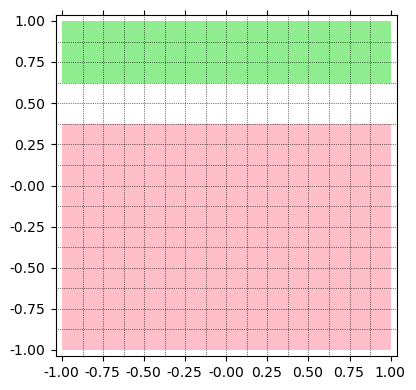

In [33]:
ctx_sig.plot_histogram2d(4)

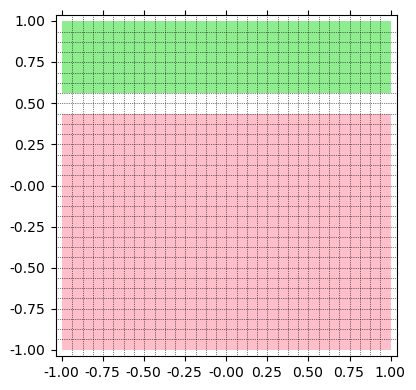

In [34]:
with suppress_stdout():
    p3 = ctx_sig.plot_histogram2d(5)
    
p3

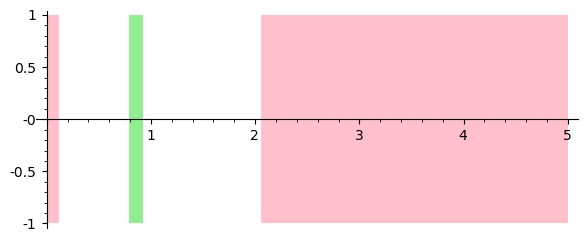

In [35]:
ctx_sig.refined_signal(1).plot()

In [36]:
sig = ctx_sig.refined_signal(2)

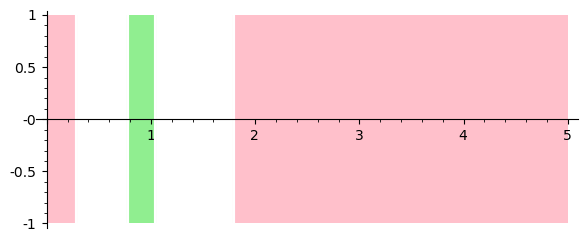

In [37]:
sig.plot()

In [38]:
sig = ctx_sig.refined_signal(3)

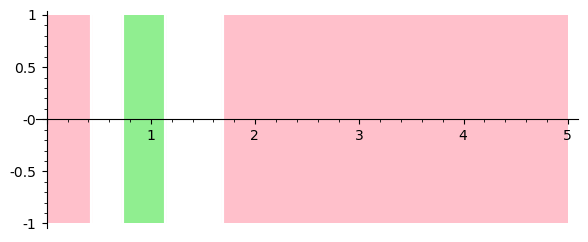

In [39]:
sig.plot()

In [40]:
sig = ctx_sig.refined_signal(4)

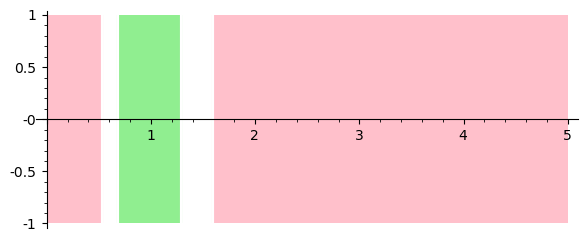

In [41]:
sig.plot()

In [42]:
sig = ctx_sig.refined_signal(5)

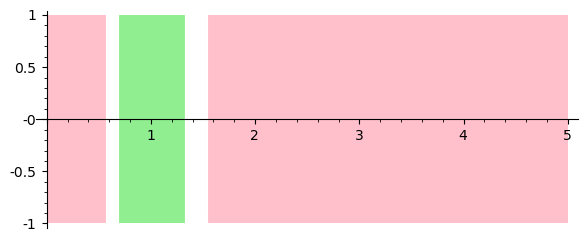

In [43]:
sig.plot()

In [44]:
su = m.process("[1, 1.2] Whelk || [5, 6] Lobster with network N([0.7, 0.75], 0.6, 0.3, 0.05, 2)").as_system

Running cmd: 'savesage "[1, 1.2] Whelk || [5, 6] Lobster with network N([0.7, 0.75], 0.6, 0.3, 0.05, 2)" "/tmp/bond-sage-script-s2dasc1l.py"' ...


In [45]:
from flowstar.reachability import IntegrationMethod

In [46]:
help(IntegrationMethod)

Help on class IntegrationMethod in module flowstar.reachability:

class IntegrationMethod(enum.IntEnum)
 |  IntegrationMethod(value, names=None, *, module=None, qualname=None, type=None, start=1)
 |  
 |  An enumeration.
 |  
 |  Method resolution order:
 |      IntegrationMethod
 |      enum.IntEnum
 |      builtins.int
 |      enum.Enum
 |      builtins.object
 |  
 |  Data and other attributes defined here:
 |  
 |  HIGH_DEGREE = <IntegrationMethod.HIGH_DEGREE: 3>
 |  
 |  LOW_DEGREE = <IntegrationMethod.LOW_DEGREE: 2>
 |  
 |  LTI = <IntegrationMethod.LTI: 5>
 |  
 |  LTV = <IntegrationMethod.LTV: 6>
 |  
 |  NONPOLY_TAYLOR = <IntegrationMethod.NONPOLY_TAYLOR: 4>
 |  
 |  NONPOLY_TAYLOR_SYMB = <IntegrationMethod.NONPOLY_TAYLOR_SYMB: 8>
 |  
 |  ONLY_PICARD = <IntegrationMethod.ONLY_PICARD: 1>
 |  
 |  ONLY_PICARD_SYMB = <IntegrationMethod.ONLY_PICARD_SYMB: 7>
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors inherited from enum.Enu

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[5 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 2.?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.3?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function base_context_signal.<locals>.<lambda> at 0x7f9e94cacc10>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9e94cb7d00>
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=6, step=(0.00100000000000000, 0.100000000000000), precondition=1, estimation=0.00100000000000000, integration_method=<IntegrationMethod.ONLY_PICARD_SYMB: 7>, cutoff_threshold=0.0000100000000000000, max_remainder_queue=5

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


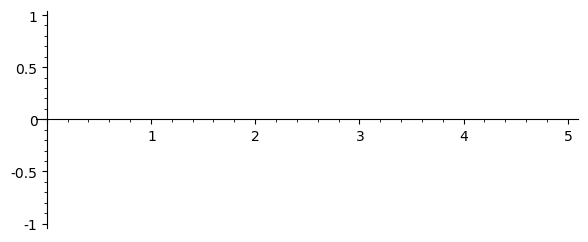

In [47]:
ctx_sig = prop.context_signal_for_system(
    su, 5, order=6, step=(0.001, 0.1),
    precondition=1,
    estimation=1e-3,
    integration_method=IntegrationMethod.ONLY_PICARD_SYMB,
    cutoff_threshold=1e-5,
    max_remainder_queue=500,
    symbolic_composition=True,
    use_masks=True,
)
ctx_sig.signal.plot()

 ==> creating ContextSignal with coord=(0,), signal = <function base_context_signal.<locals>.<lambda> at 0x7f9e94cacc10>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9e94cb7400>
 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=6, step=(0.00100000000000000, 0.100000000000000), precondition=1, estimation=0.00100000000000000, integration_method=<IntegrationMethod.ONLY_PICARD_SYMB: 7>, cutoff_threshold=0.0000100000000000000, max_remainder_queue=500, symbolic_composition=True, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f9e94cb2c00>, print_timings=False, unpreconditioning_order=6, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7f9e94cb7b50>, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7f9e9545da90>
recomputing reachset
PolyObserver(x0^2 +

top-level root detection: 1 items in 0.49 seconds
roots = [[0.080813951775661696 .. 0.35801752232542495]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.080813951775661696 .. 0.35801752232542495]]
seg_domain = [0.0000000000000000 .. 1.7057120548517089]
roots = [[0.080813951775661696 .. 0.35801752232542495]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.080813951775661697], False), ([0.35801752232542494 .. 1.3867455195878034], True), ([1.7057120548517088 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.080813951775661697], False), ([0.35801752232542494 .. 1.3867455195878034], True), ([1.7057120548517088 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=

top-level root detection: 1 items in 0.39 seconds
roots = [[1.7437266941643452 .. 1.7785988066397296]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7437266941643452 .. 1.7785988066397296]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7437266941643452 .. 1.7785988066397296]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6437266941643452], True), ([1.6785988066397297 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6437266941643452], True), ([1.6785988066397297 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.33 seconds
roots = [[1.7408785701011539 .. 1.7749988639091648]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7408785701011539 .. 1.7749988639091648]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7408785701011539 .. 1.7749988639091648]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6408785701011539], True), ([1.6749988639091648 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6408785701011539], True), ([1.6749988639091648 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.46 seconds
roots = [[1.7149679576405034 .. 1.7489064000523618]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7149679576405034 .. 1.7489064000523618]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7149679576405034 .. 1.7489064000523618]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6149679576405034], True), ([1.6489064000523618 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6149679576405034], True), ([1.6489064000523618 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.43 seconds
roots = [[1.7118250902599789 .. 1.7460674316871585]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7118250902599789 .. 1.7460674316871585]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7118250902599789 .. 1.7460674316871585]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6118250902599789], True), ([1.6460674316871586 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6118250902599789], True), ([1.6460674316871586 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.35 seconds
roots = [[1.7343694738316888 .. 1.8006172348793302]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7343694738316888 .. 1.8006172348793302]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7343694738316888 .. 1.8006172348793302]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6343694738316888], True), ([1.7006172348793302 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6343694738316888], True), ([1.7006172348793302 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.32 seconds
roots = [[1.7382013686947979 .. 1.7714872181107358]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7382013686947979 .. 1.7714872181107358]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7382013686947979 .. 1.7714872181107358]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6382013686947979], True), ([1.6714872181107358 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6382013686947979], True), ([1.6714872181107358 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.33 seconds
roots = [[1.7354077991796070 .. 1.7680625373518065]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7354077991796070 .. 1.7680625373518065]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7354077991796070 .. 1.7680625373518065]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6354077991796070], True), ([1.6680625373518065 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6354077991796070], True), ([1.6680625373518065 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.44 seconds
roots = [[1.7084456100322666 .. 1.7440935981399733]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7084456100322666 .. 1.7440935981399733]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7084456100322666 .. 1.7440935981399733]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6084456100322667], True), ([1.6440935981399733 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6084456100322667], True), ([1.6440935981399733 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.45 seconds
roots = [[1.7057857614475766 .. 1.7406781183768408]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7057857614475766 .. 1.7406781183768408]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7057857614475766 .. 1.7406781183768408]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6057857614475766], True), ([1.6406781183768408 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6057857614475766], True), ([1.6406781183768408 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.70 seconds
roots = [[1.4867455195878034 .. 1.8057120548517088]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4867455195878034 .. 1.8057120548517088]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4867455195878034 .. 1.8057120548517088]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3867455195878034], True), ([1.7057120548517088 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3867455195878034], True), ([1.7057120548517088 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

top-level root detection: 1 items in 0.62 seconds
roots = [[1.6520153624815243 .. 1.6908132458515944]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6520153624815243 .. 1.6908132458515944]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6520153624815243 .. 1.6908132458515944]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5520153624815243], True), ([1.5908132458515944 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5520153624815243], True), ([1.5908132458515944 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.62 seconds
roots = [[1.6495906979225796 .. 1.6874721919940315]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6495906979225796 .. 1.6874721919940315]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6495906979225796 .. 1.6874721919940315]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5495906979225796], True), ([1.5874721919940315 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5495906979225796], True), ([1.5874721919940315 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.54 seconds
roots = [[1.5286206622746354 .. 1.5290515024413614], [1.5300272647028154 .. 1.6436164889577619]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5286206622746354 .. 1.5290515024413614], 
 [1.5300272647028154 .. 1.6436164889577619]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5286206622746354 .. 1.5290515024413614], 
 [1.5300272647028154 .. 1.6436164889577619]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4300272647028154], True), ([1.5436164889577619 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.43002726

top-level root detection: 1 items in 0.47 seconds
roots = [[1.5431921938905248 .. 1.6039113540149415]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5431921938905248 .. 1.6039113540149415]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5431921938905248 .. 1.6039113540149415]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4431921938905248], True), ([1.5039113540149415 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4431921938905248], True), ([1.5039113540149415 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.45 seconds
roots = [[1.5409836243117247 .. 1.6010767726572440]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5409836243117247 .. 1.6010767726572440]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5409836243117247 .. 1.6010767726572440]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4409836243117247], True), ([1.5010767726572440 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4409836243117247], True), ([1.5010767726572440 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.38 seconds
roots = [[1.6469484710724457 .. 1.6842476237427813]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6469484710724457 .. 1.6842476237427813]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6469484710724457 .. 1.6842476237427813]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5469484710724458], True), ([1.5842476237427813 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5469484710724458], True), ([1.5842476237427813 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.38 seconds
roots = [[1.6442846445057550 .. 1.6811169910241790]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6442846445057550 .. 1.6811169910241790]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6442846445057550 .. 1.6811169910241790]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5442846445057550], True), ([1.5811169910241791 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5442846445057550], True), ([1.5811169910241791 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.62 seconds
roots = [[1.5257418109622886 .. 1.6371834387616707]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5257418109622886 .. 1.6371834387616707]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5257418109622886 .. 1.6371834387616707]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4257418109622886], True), ([1.5371834387616707 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4257418109622886], True), ([1.5371834387616707 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.78 seconds
roots = [[1.5381628870827195 .. 1.5382110718876279], [1.5388721462547203 .. 1.5997231680566700]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5381628870827195 .. 1.5382110718876279], 
 [1.5388721462547203 .. 1.5997231680566700]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5381628870827195 .. 1.5382110718876279], 
 [1.5388721462547203 .. 1.5997231680566700]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4388721462547203], True), ([1.4997231680566700 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.43

top-level root detection: 1 items in 0.53 seconds
roots = [[1.5365102318744752 .. 1.5987827199176888]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5365102318744752 .. 1.5987827199176888]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5365102318744752 .. 1.5987827199176888]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4365102318744752], True), ([1.4987827199176888 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4365102318744752], True), ([1.4987827199176888 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.20 seconds
roots = [[0.080813951775661696 .. 0.35801752232542495]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.080813951775661696 .. 0.35801752232542495]]
seg_domain = [0.0000000000000000 .. 1.7057120548517089]
roots = [[0.080813951775661696 .. 0.35801752232542495]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.080813951775661697], False), ([0.35801752232542494 .. 1.3867455195878034], True), ([1.7057120548517088 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.080813951775661697], False), ([0.35801752232542494 .. 1.3867455195878034], True), ([1.7057120548517088 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=

top-level root detection: 1 items in 0.43 seconds
roots = [[1.7319466004257901 .. 1.7670844695891837]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7319466004257901 .. 1.7670844695891837]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7319466004257901 .. 1.7670844695891837]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6319466004257901], True), ([1.6670844695891837 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6319466004257901], True), ([1.6670844695891837 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.36 seconds
roots = [[1.7284620366606664 .. 1.7642129088859065]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7284620366606664 .. 1.7642129088859065]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7284620366606664 .. 1.7642129088859065]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6284620366606664], True), ([1.6642129088859065 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6284620366606664], True), ([1.6642129088859065 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.43 seconds
roots = [[1.7029306323758821 .. 1.7373985587457988]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7029306323758821 .. 1.7373985587457988]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7029306323758821 .. 1.7373985587457988]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6029306323758821], True), ([1.6373985587457988 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6029306323758821], True), ([1.6373985587457988 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.47 seconds
roots = [[1.6998176310918975 .. 1.7347013909341203]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6998176310918975 .. 1.7347013909341203]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6998176310918975 .. 1.7347013909341203]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5998176310918975], True), ([1.6347013909341203 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5998176310918975], True), ([1.6347013909341203 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.40 seconds
roots = [[1.7194554110321522 .. 1.7906195328233128]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7194554110321522 .. 1.7906195328233128]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7194554110321522 .. 1.7906195328233128]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6194554110321522], True), ([1.6906195328233128 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6194554110321522], True), ([1.6906195328233128 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.33 seconds
roots = [[1.7248008214833026 .. 1.7614249616545028]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7248008214833026 .. 1.7614249616545028]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7248008214833026 .. 1.7614249616545028]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6248008214833026], True), ([1.6614249616545029 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6248008214833026], True), ([1.6614249616545029 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.46 seconds
roots = [[1.7219169599440848 .. 1.7587191126836903]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7219169599440848 .. 1.7587191126836903]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7219169599440848 .. 1.7587191126836903]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6219169599440849], True), ([1.6587191126836904 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6219169599440849], True), ([1.6587191126836904 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.40 seconds
roots = [[1.6965432820580457 .. 1.7320683666703916]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6965432820580457 .. 1.7320683666703916]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6965432820580457 .. 1.7320683666703916]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5965432820580457], True), ([1.6320683666703916 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5965432820580457], True), ([1.6320683666703916 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.42 seconds
roots = [[1.6929357974116336 .. 1.7295185806784231]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6929357974116336 .. 1.7295185806784231]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6929357974116336 .. 1.7295185806784231]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5929357974116337], True), ([1.6295185806784231 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5929357974116337], True), ([1.6295185806784231 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.77 seconds
roots = [[1.4867455195878034 .. 1.8057120548517088]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4867455195878034 .. 1.8057120548517088]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4867455195878034 .. 1.8057120548517088]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3867455195878034], True), ([1.7057120548517088 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3867455195878034], True), ([1.7057120548517088 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

top-level root detection: 1 items in 0.46 seconds
roots = [[1.6415095953301888 .. 1.6793608241694181]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6415095953301888 .. 1.6793608241694181]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6415095953301888 .. 1.6793608241694181]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5415095953301888], True), ([1.5793608241694181 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5415095953301888], True), ([1.5793608241694181 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.49 seconds
roots = [[1.6388856007057996 .. 1.6778114834749783]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6388856007057996 .. 1.6778114834749783]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6388856007057996 .. 1.6778114834749783]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5388856007057997], True), ([1.5778114834749783 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5388856007057997], True), ([1.5778114834749783 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.55 seconds
roots = [[1.5184006664738951 .. 1.5207246211265735], [1.5220919463700515 .. 1.6337993136730445]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5184006664738951 .. 1.5207246211265735], 
 [1.5220919463700515 .. 1.6337993136730445]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5184006664738951 .. 1.5207246211265735], 
 [1.5220919463700515 .. 1.6337993136730445]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4220919463700515], True), ([1.5337993136730445 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.42209194

top-level root detection: 1 items in 0.59 seconds
roots = [[1.5349550658222150 .. 1.5969696252403061]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5349550658222150 .. 1.5969696252403061]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5349550658222150 .. 1.5969696252403061]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4349550658222150], True), ([1.4969696252403061 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4349550658222150], True), ([1.4969696252403061 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.71 seconds
roots = [[1.5327927994374184 .. 1.5953800596421502]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5327927994374184 .. 1.5953800596421502]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5327927994374184 .. 1.5953800596421502]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4327927994374184], True), ([1.4953800596421502 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4327927994374184], True), ([1.4953800596421502 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.54 seconds
roots = [[1.6359542984924331 .. 1.6755142845303793]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6359542984924331 .. 1.6755142845303793]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6359542984924331 .. 1.6755142845303793]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5359542984924331], True), ([1.5755142845303793 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5359542984924331], True), ([1.5755142845303793 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.45 seconds
roots = [[1.6316776685386258 .. 1.6733039377450039]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6316776685386258 .. 1.6733039377450039]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6316776685386258 .. 1.6733039377450039]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5316776685386258], True), ([1.5733039377450039 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5316776685386258], True), ([1.5733039377450039 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.46 seconds
roots = [[1.5141494785519651 .. 1.6337993136730445]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5141494785519651 .. 1.6337993136730445]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5141494785519651 .. 1.6337993136730445]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4141494785519651], True), ([1.5337993136730445 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4141494785519651], True), ([1.5337993136730445 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.63 seconds
roots = [[1.5304117545168791 .. 1.5939193580958198]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5304117545168791 .. 1.5939193580958198]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5304117545168791 .. 1.5939193580958198]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4304117545168791], True), ([1.4939193580958198 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4304117545168791], True), ([1.4939193580958198 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.53 seconds
roots = [[1.5277745677465901 .. 1.5925684523734569]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5277745677465901 .. 1.5925684523734569]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5277745677465901 .. 1.5925684523734569]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4277745677465901], True), ([1.4925684523734570 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4277745677465901], True), ([1.4925684523734570 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce34c0>, 0, symbolic_composition=True, symbolic_composition_order=6, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7f9e94ce34c0>, , symbolic_composition=True, symbolic_composition_order=6, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fp

top-level root detection: 1 items in 0.19 seconds
roots = [[1.5397537865948431 .. 1.5618059902509192]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5397537865948431 .. 1.5618059902509192]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5397537865948431 .. 1.5618059902509192]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4397537865948431], True), ([1.4618059902509192 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4397537865948431], True), ([1.4618059902509192 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.5385776137043725 .. 1.5604121041243642]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5385776137043725 .. 1.5604121041243642]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5385776137043725 .. 1.5604121041243642]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4385776137043725], True), ([1.4604121041243642 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4385776137043725], True), ([1.4604121041243642 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.28 seconds
roots = [[1.4792857485845165 .. 1.5227177482547550]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4792857485845165 .. 1.5227177482547550]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4792857485845165 .. 1.5227177482547550]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3792857485845165], True), ([1.4227177482547550 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3792857485845165], True), ([1.4227177482547550 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.25 seconds
roots = [[1.4804570037548108 .. 1.5020967447271989]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4804570037548108 .. 1.5020967447271989]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4804570037548108 .. 1.5020967447271989]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3804570037548108], True), ([1.4020967447271990 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3804570037548108], True), ([1.4020967447271990 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4798438804664912 .. 1.5017171879634826]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4798438804664912 .. 1.5017171879634826]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4798438804664912 .. 1.5017171879634826]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3798438804664913], True), ([1.4017171879634826 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3798438804664913], True), ([1.4017171879634826 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.20 seconds
roots = [[1.5374719744449218 .. 1.5590912780315463]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5374719744449218 .. 1.5590912780315463]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5374719744449218 .. 1.5590912780315463]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4374719744449219], True), ([1.4590912780315463 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4374719744449219], True), ([1.4590912780315463 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.19 seconds
roots = [[1.5363024044646795 .. 1.5363840627281667], [1.5364382443788866 .. 1.5578436983201623]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5363024044646795 .. 1.5363840627281667], 
 [1.5364382443788866 .. 1.5578436983201623]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5363024044646795 .. 1.5363840627281667], 
 [1.5364382443788866 .. 1.5578436983201623]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4364382443788866], True), ([1.4578436983201623 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.43

top-level root detection: 1 items in 0.26 seconds
roots = [[1.4781766164586758 .. 1.5203612921335588]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4781766164586758 .. 1.5203612921335588]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4781766164586758 .. 1.5203612921335588]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3781766164586758], True), ([1.4203612921335588 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3781766164586758], True), ([1.4203612921335588 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.20 seconds
roots = [[1.4792461992950316 .. 1.5014425884303640]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4792461992950316 .. 1.5014425884303640]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4792461992950316 .. 1.5014425884303640]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3792461992950316], True), ([1.4014425884303640 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3792461992950316], True), ([1.4014425884303640 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.20 seconds
roots = [[1.4787348252567484 .. 1.5006053318941564]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4787348252567484 .. 1.5006053318941564]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4787348252567484 .. 1.5006053318941564]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3787348252567484], True), ([1.4006053318941564 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3787348252567484], True), ([1.4006053318941564 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.24 seconds
roots = [[1.4325914520139619 .. 1.4863703688324544]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4325914520139619 .. 1.4863703688324544]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4325914520139619 .. 1.4863703688324544]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3325914520139619], True), ([1.3863703688324544 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3325914520139619], True), ([1.3863703688324544 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4354114719773418 .. 1.4638450878566854]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4354114719773418 .. 1.4638450878566854]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4354114719773418 .. 1.4638450878566854]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3354114719773418], True), ([1.3638450878566854 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3354114719773418], True), ([1.3638450878566854 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.29 seconds
roots = [[1.4351597652195555 .. 1.4632290273172933]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4351597652195555 .. 1.4632290273172933]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4351597652195555 .. 1.4632290273172933]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3351597652195555], True), ([1.3632290273172933 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3351597652195555], True), ([1.3632290273172933 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.31 seconds
roots = [[1.4128147666128199 .. 1.4455449367909601]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4128147666128199 .. 1.4455449367909601]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4128147666128199 .. 1.4455449367909601]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3128147666128199], True), ([1.3455449367909602 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3128147666128199], True), ([1.3455449367909602 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.28 seconds
roots = [[1.4128017605198035 .. 1.4451602312423125]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4128017605198035 .. 1.4451602312423125]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4128017605198035 .. 1.4451602312423125]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3128017605198035], True), ([1.3451602312423125 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3128017605198035], True), ([1.3451602312423125 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.29 seconds
roots = [[1.4324093918215616 .. 1.4846709348274479]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4324093918215616 .. 1.4846709348274479]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4324093918215616 .. 1.4846709348274479]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3324093918215616], True), ([1.3846709348274479 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3324093918215616], True), ([1.3846709348274479 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4350034807212448 .. 1.4627123950933616]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4350034807212448 .. 1.4627123950933616]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4350034807212448 .. 1.4627123950933616]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3350034807212448], True), ([1.3627123950933617 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3350034807212448], True), ([1.3627123950933617 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.21 seconds
roots = [[1.4349439406647646 .. 1.4622960603298779]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4349439406647646 .. 1.4622960603298779]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4349439406647646 .. 1.4622960603298779]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3349439406647646], True), ([1.3622960603298779 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3349439406647646], True), ([1.3622960603298779 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.35 seconds
roots = [[1.4128804498698843 .. 1.4448831259448034]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4128804498698843 .. 1.4448831259448034]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4128804498698843 .. 1.4448831259448034]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3128804498698843], True), ([1.3448831259448035 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3128804498698843], True), ([1.3448831259448035 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.40 seconds
roots = [[1.4130520609630405 .. 1.4447146459616529]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4130520609630405 .. 1.4447146459616529]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4130520609630405 .. 1.4447146459616529]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3130520609630406], True), ([1.3447146459616530 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3130520609630406], True), ([1.3447146459616530 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.58 seconds
roots = [[1.3638285012729807 .. 1.3666319259476290], [1.3672497964757004 .. 1.5655523768911211]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3638285012729807 .. 1.3666319259476290], 
 [1.3672497964757004 .. 1.5655523768911211]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3638285012729807 .. 1.3666319259476290], 
 [1.3672497964757004 .. 1.5655523768911211]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2672497964757004], True), ([1.4655523768911211 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.26724979647570

top-level root detection: 1 items in 0.22 seconds
roots = [[1.5351408494334994 .. 1.5567097686573277]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5351408494334994 .. 1.5567097686573277]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5351408494334994 .. 1.5567097686573277]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4351408494334994], True), ([1.4567097686573278 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4351408494334994], True), ([1.4567097686573278 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.20 seconds
roots = [[1.5339851418932510 .. 1.5563587858068655]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5339851418932510 .. 1.5563587858068655]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5339851418932510 .. 1.5563587858068655]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4339851418932510], True), ([1.4563587858068656 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4339851418932510], True), ([1.4563587858068656 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4759956405754952 .. 1.5185456255446557]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4759956405754952 .. 1.5185456255446557]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4759956405754952 .. 1.5185456255446557]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3759956405754952], True), ([1.4185456255446557 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3759956405754952], True), ([1.4185456255446557 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.27 seconds
roots = [[1.4779595435872445 .. 1.4999136479986324]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4779595435872445 .. 1.4999136479986324]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4779595435872445 .. 1.4999136479986324]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3779595435872445], True), ([1.3999136479986324 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3779595435872445], True), ([1.3999136479986324 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.20 seconds
roots = [[1.4772174876977224 .. 1.4996679743553004]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4772174876977224 .. 1.4996679743553004]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4772174876977224 .. 1.4996679743553004]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3772174876977224], True), ([1.3996679743553004 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3772174876977224], True), ([1.3996679743553004 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.22 seconds
roots = [[1.5328961704700521 .. 1.5563587858068655]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5328961704700521 .. 1.5563587858068655]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5328961704700521 .. 1.5563587858068655]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4328961704700521], True), ([1.4563587858068656 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4328961704700521], True), ([1.4563587858068656 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.22 seconds
roots = [[1.5319212840071163 .. 1.5562992650243029]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5319212840071163 .. 1.5562992650243029]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5319212840071163 .. 1.5562992650243029]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4319212840071163], True), ([1.4562992650243029 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4319212840071163], True), ([1.4562992650243029 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.37 seconds
roots = [[1.4739306654141897 .. 1.5184590223457018]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4739306654141897 .. 1.5184590223457018]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4739306654141897 .. 1.5184590223457018]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3739306654141897], True), ([1.4184590223457018 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3739306654141897], True), ([1.4184590223457018 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.30 seconds
roots = [[1.4765612651385839 .. 1.4995145057686433]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4765612651385839 .. 1.4995145057686433]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4765612651385839 .. 1.4995145057686433]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3765612651385840], True), ([1.3995145057686433 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3765612651385840], True), ([1.3995145057686433 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4759924577896095 .. 1.4994545137407247]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4759924577896095 .. 1.4994545137407247]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4759924577896095 .. 1.4994545137407247]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3759924577896095], True), ([1.3994545137407248 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3759924577896095], True), ([1.3994545137407248 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.26 seconds
roots = [[1.4323469428128754 .. 1.4850082870145969]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4323469428128754 .. 1.4850082870145969]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4323469428128754 .. 1.4850082870145969]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3323469428128754], True), ([1.3850082870145969 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3323469428128754], True), ([1.3850082870145969 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.25 seconds
roots = [[1.4349161856000336 .. 1.4623689628331254]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4349161856000336 .. 1.4623689628331254]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4349161856000336 .. 1.4623689628331254]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3349161856000336], True), ([1.3623689628331254 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3349161856000336], True), ([1.3623689628331254 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.29 seconds
roots = [[1.4345962842160442 .. 1.4626024390151320]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4345962842160442 .. 1.4626024390151320]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4345962842160442 .. 1.4626024390151320]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3345962842160442], True), ([1.3626024390151321 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3345962842160442], True), ([1.3626024390151321 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.28 seconds
roots = [[1.4132580389471804 .. 1.4450791910840933]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4132580389471804 .. 1.4450791910840933]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4132580389471804 .. 1.4450791910840933]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3132580389471805], True), ([1.3450791910840933 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3132580389471805], True), ([1.3450791910840933 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.29 seconds
roots = [[1.4131892372396501 .. 1.4456240273476298]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4131892372396501 .. 1.4456240273476298]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4131892372396501 .. 1.4456240273476298]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3131892372396501], True), ([1.3456240273476298 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3131892372396501], True), ([1.3456240273476298 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.27 seconds
roots = [[1.4313109242557597 .. 1.4860454081681230]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4313109242557597 .. 1.4860454081681230]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4313109242557597 .. 1.4860454081681230]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3313109242557597], True), ([1.3860454081681230 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3313109242557597], True), ([1.3860454081681230 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4343729387670620 .. 1.4629436875545610]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4343729387670620 .. 1.4629436875545610]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4343729387670620 .. 1.4629436875545610]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3343729387670620], True), ([1.3629436875545610 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3343729387670620], True), ([1.3629436875545610 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4342474087277239 .. 1.4633944926747875]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4342474087277239 .. 1.4633944926747875]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4342474087277239 .. 1.4633944926747875]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3342474087277239], True), ([1.3633944926747876 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3342474087277239], True), ([1.3633944926747876 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.28 seconds
roots = [[1.4132129501271668 .. 1.4462873647258239]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4132129501271668 .. 1.4462873647258239]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4132129501271668 .. 1.4462873647258239]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3132129501271668], True), ([1.3462873647258239 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3132129501271668], True), ([1.3462873647258239 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.35 seconds
roots = [[1.4133300614517159 .. 1.4470713231534161]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4133300614517159 .. 1.4470713231534161]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4133300614517159 .. 1.4470713231534161]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3133300614517159], True), ([1.3470713231534161 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3133300614517159], True), ([1.3470713231534161 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3a60>, 0, symbolic_composition=True, symbolic_composition_order=6, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7f9e94ce3a60>, , symbolic_composition=True, symbolic_composition_order=6, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fp

top-level root detection: 1 items in 0.40 seconds
roots = [[1.7448116290495077 .. 1.7762878900574098]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7448116290495077 .. 1.7762878900574098]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7448116290495077 .. 1.7762878900574098]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6448116290495077], True), ([1.6762878900574098 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6448116290495077], True), ([1.6762878900574098 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.36 seconds
roots = [[1.7420913833707634 .. 1.7727968073782657]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7420913833707634 .. 1.7727968073782657]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7420913833707634 .. 1.7727968073782657]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6420913833707634], True), ([1.6727968073782657 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6420913833707634], True), ([1.6727968073782657 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.40 seconds
roots = [[1.6585132500110126 .. 1.7234200008755996]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6585132500110126 .. 1.7234200008755996]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6585132500110126 .. 1.7234200008755996]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5585132500110126], True), ([1.6234200008755996 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5585132500110126], True), ([1.6234200008755996 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.38 seconds
roots = [[1.6629507275568162 .. 1.6949714308938833]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6629507275568162 .. 1.6949714308938833]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6629507275568162 .. 1.6949714308938833]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5629507275568162], True), ([1.5949714308938833 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5629507275568162], True), ([1.5949714308938833 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.45 seconds
roots = [[1.6597421851568585 .. 1.6936251104413050]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6597421851568585 .. 1.6936251104413050]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6597421851568585 .. 1.6936251104413050]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5597421851568585], True), ([1.5936251104413050 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5597421851568585], True), ([1.5936251104413050 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.38 seconds
roots = [[1.7391552035727495 .. 1.7693661781187140]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7391552035727495 .. 1.7693661781187140]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7391552035727495 .. 1.7693661781187140]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6391552035727495], True), ([1.6693661781187141 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6391552035727495], True), ([1.6693661781187141 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.44 seconds
roots = [[1.7361351232354518 .. 1.7660499113733770]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7361351232354518 .. 1.7660499113733770]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7361351232354518 .. 1.7660499113733770]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6361351232354518], True), ([1.6660499113733771 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6361351232354518], True), ([1.6660499113733771 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.47 seconds
roots = [[1.6542016606491543 .. 1.7168838161957239], [1.9297352767972915 .. 1.9495429523832684]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6542016606491543 .. 1.7168838161957239], 
 [1.9297352767972915 .. 1.9495429523832684]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6542016606491543 .. 1.7168838161957239], 
 [1.9297352767972915 .. 1.9495429523832684]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5542016606491543], True), ([1.6168838161957239 .. 1.7297352767972914], False), ([1.8495429523832684 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 5.2

top-level root detection: 1 items in 0.44 seconds
roots = [[1.6572628765632149 .. 1.6903527900021176]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6572628765632149 .. 1.6903527900021176]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6572628765632149 .. 1.6903527900021176]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5572628765632149], True), ([1.5903527900021177 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5572628765632149], True), ([1.5903527900021177 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.58 seconds
roots = [[1.6549213370797368 .. 1.6871765087516859]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6549213370797368 .. 1.6871765087516859]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6549213370797368 .. 1.6871765087516859]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5549213370797368], True), ([1.5871765087516860 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5549213370797368], True), ([1.5871765087516860 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.48 seconds
roots = [[1.5367361399327152 .. 1.5488232089560459], [1.5925063017712557 .. 1.5928322272697049], [1.5957323954883746 .. 1.6730106254077555], [2.0216626991913853 .. 2.0506631170167742]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5367361399327152 .. 1.5488232089560459], 
 [1.5925063017712557 .. 1.5928322272697049], 
 [1.5957323954883746 .. 1.6730106254077555], 
 [2.0216626991913853 .. 2.0506631170167742]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5367361399327152 .. 1.5488232089560459], 
 [1.5925063017712557 .. 1.5928322272697049], 
 [1.5957323954883746 .. 1.6730106254077555], 
 [2.0216626991913853 .. 2.0506631170167742]]
signal given bool roots: 1 items in 0.02 seconds
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4925063017712557], True), ([1.5730106254077556 .. 1.8216626991913852], False), ([1.95066

top-level root detection: 1 items in 0.49 seconds
roots = [[1.6005248151598687 .. 1.6425868826388748]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6005248151598687 .. 1.6425868826388748]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6005248151598687 .. 1.6425868826388748]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5005248151598687], True), ([1.5425868826388748 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5005248151598687], True), ([1.5425868826388748 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.53 seconds
roots = [[1.5983149956174518 .. 1.6394727051385370]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5983149956174518 .. 1.6394727051385370]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5983149956174518 .. 1.6394727051385370]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4983149956174518], True), ([1.5394727051385370 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4983149956174518], True), ([1.5394727051385370 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.52 seconds
roots = [[1.5668800491425149 .. 1.6156882347391044]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5668800491425149 .. 1.6156882347391044]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5668800491425149 .. 1.6156882347391044]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4668800491425150], True), ([1.5156882347391045 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4668800491425150], True), ([1.5156882347391045 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.52 seconds
roots = [[1.5643935157951525 .. 1.6127339951989031]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5643935157951525 .. 1.6127339951989031]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5643935157951525 .. 1.6127339951989031]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4643935157951525], True), ([1.5127339951989031 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4643935157951525], True), ([1.5127339951989031 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.46 seconds
roots = [[1.5886550278349347 .. 1.6658622576161573]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5886550278349347 .. 1.6658622576161573]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5886550278349347 .. 1.6658622576161573]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4886550278349347], True), ([1.5658622576161573 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4886550278349347], True), ([1.5658622576161573 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.44 seconds
roots = [[1.5959877632791532 .. 1.6364668391841686]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5959877632791532 .. 1.6364668391841686]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5959877632791532 .. 1.6364668391841686]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4959877632791532], True), ([1.5364668391841687 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4959877632791532], True), ([1.5364668391841687 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.51 seconds
roots = [[1.5920212524994783 .. 1.5928322272697049], [1.5935621728587940 .. 1.6338973680046903]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5920212524994783 .. 1.5928322272697049], 
 [1.5935621728587940 .. 1.6338973680046903]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5920212524994783 .. 1.5928322272697049], 
 [1.5935621728587940 .. 1.6338973680046903]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4935621728587941], True), ([1.5338973680046903 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.49

top-level root detection: 1 items in 0.46 seconds
roots = [[1.5612976172141661 .. 1.6114137389144945]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5612976172141661 .. 1.6114137389144945]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5612976172141661 .. 1.6114137389144945]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4612976172141661], True), ([1.5114137389144945 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4612976172141661], True), ([1.5114137389144945 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.46 seconds
roots = [[1.5594151035275336 .. 1.6087344811567673]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5594151035275336 .. 1.6087344811567673]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5594151035275336 .. 1.6087344811567673]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4594151035275336], True), ([1.5087344811567673 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4594151035275336], True), ([1.5087344811567673 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.62 seconds
roots = [[1.4729497198319811 .. 1.7766762004527566]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4729497198319811 .. 1.7766762004527566]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4729497198319811 .. 1.7766762004527566]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3729497198319812], True), ([1.6766762004527566 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3729497198319812], True), ([1.6766762004527566 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSign

top-level root detection: 1 items in 0.39 seconds
roots = [[1.7326613907073653 .. 1.7628399804064699]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7326613907073653 .. 1.7628399804064699]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7326613907073653 .. 1.7628399804064699]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6326613907073653], True), ([1.6628399804064699 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6326613907073653], True), ([1.6628399804064699 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.36 seconds
roots = [[1.7297549580933644 .. 1.7614027676500857]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7297549580933644 .. 1.7614027676500857]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7297549580933644 .. 1.7614027676500857]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6297549580933644], True), ([1.6614027676500857 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6297549580933644], True), ([1.6614027676500857 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.55 seconds
roots = [[1.1626481285718528 .. 1.1684851707769899], [1.6459889320180967 .. 1.6468522209566601], [1.6469772552047430 .. 1.7129880407617611]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.1626481285718528 .. 1.1684851707769899], 
 [1.6459889320180967 .. 1.6468522209566601], 
 [1.6469772552047430 .. 1.7129880407617611]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.1626481285718528 .. 1.1684851707769899], 
 [1.6459889320180967 .. 1.6468522209566601], 
 [1.6469772552047430 .. 1.7129880407617611]]
signal given bool roots: 1 items in 0.03 seconds
 ==> creating ContextSignal with coord=(2, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5469772552047430], True), ([1.6129880407617611 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> crea

top-level root detection: 1 items in 0.46 seconds
roots = [[1.6519289016958467 .. 1.6841607518074118], [1.7234200008755142 .. 1.7348951570008220]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6519289016958467 .. 1.6841607518074118], 
 [1.7234200008755142 .. 1.7348951570008220]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6519289016958467 .. 1.6841607518074118], 
 [1.7234200008755142 .. 1.7348951570008220]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5519289016958467], True), ([1.6348951570008221 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.55

top-level root detection: 1 items in 0.49 seconds
roots = [[1.6487731421163176 .. 1.6817232008208592]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6487731421163176 .. 1.6817232008208592]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6487731421163176 .. 1.6817232008208592]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5487731421163176], True), ([1.5817232008208592 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5487731421163176], True), ([1.5817232008208592 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.37 seconds
roots = [[1.7265690610416586 .. 1.7587667817237316]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7265690610416586 .. 1.7587667817237316]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7265690610416586 .. 1.7587667817237316]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6265690610416586], True), ([1.6587667817237317 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6265690610416586], True), ([1.6587667817237317 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.51 seconds
roots = [[1.7229919153339805 .. 1.7561112364752978]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.7229919153339805 .. 1.7561112364752978]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.7229919153339805 .. 1.7561112364752978]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.6229919153339805], True), ([1.6561112364752978 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.6229919153339805], True), ([1.6561112364752978 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.53 seconds
roots = [[1.6403514054840762 .. 1.7100276600523537]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6403514054840762 .. 1.7100276600523537]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6403514054840762 .. 1.7100276600523537]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5403514054840762], True), ([1.6100276600523537 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5403514054840762], True), ([1.6100276600523537 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.52 seconds
roots = [[1.6453794006410511 .. 1.6793730135145806]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6453794006410511 .. 1.6793730135145806]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6453794006410511 .. 1.6793730135145806]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5453794006410511], True), ([1.5793730135145807 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5453794006410511], True), ([1.5793730135145807 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.51 seconds
roots = [[1.6427963797306857 .. 1.6771108956356898]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.6427963797306857 .. 1.6771108956356898]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.6427963797306857 .. 1.6771108956356898]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.5427963797306857], True), ([1.5771108956356898 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.5427963797306857], True), ([1.5771108956356898 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.46 seconds
roots = [[1.5850165108840219 .. 1.6615156747194495]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5850165108840219 .. 1.6615156747194495]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5850165108840219 .. 1.6615156747194495]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4850165108840219], True), ([1.5615156747194496 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4850165108840219], True), ([1.5615156747194496 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.50 seconds
roots = [[1.5898746726896284 .. 1.6329933026003296]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5898746726896284 .. 1.6329933026003296]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5898746726896284 .. 1.6329933026003296]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4898746726896284], True), ([1.5329933026003297 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4898746726896284], True), ([1.5329933026003297 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.44 seconds
roots = [[1.5874811832742674 .. 1.6309192910274318]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5874811832742674 .. 1.6309192910274318]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5874811832742674 .. 1.6309192910274318]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4874811832742674], True), ([1.5309192910274318 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4874811832742674], True), ([1.5309192910274318 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.47 seconds
roots = [[1.5576264518139364 .. 1.6067077004049291]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5576264518139364 .. 1.6067077004049291]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5576264518139364 .. 1.6067077004049291]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4576264518139364], True), ([1.5067077004049291 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4576264518139364], True), ([1.5067077004049291 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.48 seconds
roots = [[1.5553732283740278 .. 1.6048954298126797]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5553732283740278 .. 1.6048954298126797]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5553732283740278 .. 1.6048954298126797]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4553732283740278], True), ([1.5048954298126797 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4553732283740278], True), ([1.5048954298126797 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.49 seconds
roots = [[1.5763766278407314 .. 1.5767443383997571], [1.5780347823959062 .. 1.6611025592038269]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5763766278407314 .. 1.5767443383997571], 
 [1.5780347823959062 .. 1.6611025592038269]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5763766278407314 .. 1.5767443383997571], 
 [1.5780347823959062 .. 1.6611025592038269]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(2, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4780347823959062], True), ([1.5611025592038270 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.47803478

top-level root detection: 1 items in 0.49 seconds
roots = [[1.5851574271884707 .. 1.6289499872492288]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5851574271884707 .. 1.6289499872492288]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5851574271884707 .. 1.6289499872492288]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4851574271884707], True), ([1.5289499872492289 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4851574271884707], True), ([1.5289499872492289 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.43 seconds
roots = [[1.5825073961280253 .. 1.6270950918424297]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5825073961280253 .. 1.6270950918424297]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5825073961280253 .. 1.6270950918424297]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4825073961280253], True), ([1.5270950918424297 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4825073961280253], True), ([1.5270950918424297 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.44 seconds
roots = [[1.5527238649728938 .. 1.6031929298386132]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5527238649728938 .. 1.6031929298386132]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5527238649728938 .. 1.6031929298386132]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4527238649728938], True), ([1.5031929298386133 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4527238649728938], True), ([1.5031929298386133 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.45 seconds
roots = [[1.5501591435501325 .. 1.6016805661481762]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5501591435501325 .. 1.6016805661481762]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5501591435501325 .. 1.6016805661481762]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4501591435501325], True), ([1.5016805661481762 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4501591435501325], True), ([1.5016805661481762 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3940>, 0, symbolic_composition=True, symbolic_composition_order=6, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7f9e94ce3940>, , symbolic_composition=True, symbolic_composition_order=6, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.4020000000000002], [[0.10000000000000000 .. 5.4020000000000002]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fp

top-level root detection: 1 items in 0.19 seconds
roots = [[1.5296736758480655 .. 1.5494357579123031]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5296736758480655 .. 1.5494357579123031]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5296736758480655 .. 1.5494357579123031]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4296736758480655], True), ([1.4494357579123031 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4296736758480655], True), ([1.4494357579123031 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5286897885562245 .. 1.5482593244344006]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5286897885562245 .. 1.5482593244344006]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4286897885562245], True), ([1.4482593244344006 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4286897885562245], True), ([1.4482593244344006 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = functools.partial(<bound method Atomic.signal_fn of At

top-level root detection: 1 items in 0.21 seconds
roots = [[1.4748380958046314 .. 1.5160874487528844]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4748380958046314 .. 1.5160874487528844]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4748380958046314 .. 1.5160874487528844]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3748380958046314], True), ([1.4160874487528845 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3748380958046314], True), ([1.4160874487528845 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.018363622996618840]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.0000000000000000 .. 0.018363622996618840]]
seg_domain = [0.0000000000000000 .. 1.3973620868159476]
roots = [[0.0000000000000000 .. 0.018363622996618840]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.018363622996618839 .. 1.3761804127951281], True), ([1.3973620868159475 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.018363622996618839 .. 1.3761804127951281], True), ([1.3973620868159475 .. 5.0000000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 2), signal = <function base_context_signal.<l

top-level root detection: 1 items in 0.20 seconds
roots = [[1.5092792750490040 .. 1.5475641247946462]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5092792750490040 .. 1.5475641247946462]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5092792750490040 .. 1.5475641247946462]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4092792750490040], True), ([1.4475641247946462 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4092792750490040], True), ([1.4475641247946462 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.19 seconds
roots = [[1.5108226193773621 .. 1.5303338960719879]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5108226193773621 .. 1.5303338960719879]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5108226193773621 .. 1.5303338960719879]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4108226193773621], True), ([1.4303338960719880 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4108226193773621], True), ([1.4303338960719880 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.18 seconds
roots = [[1.5101451708916633 .. 1.5294073601051821]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5101451708916633 .. 1.5294073601051821]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5101451708916633 .. 1.5294073601051821]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4101451708916633], True), ([1.4294073601051822 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4101451708916633], True), ([1.4294073601051822 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.18 seconds
roots = [[1.4931238402135407 .. 1.5132079766961686]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4931238402135407 .. 1.5132079766961686]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4931238402135407 .. 1.5132079766961686]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3931238402135407], True), ([1.4132079766961687 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3931238402135407], True), ([1.4132079766961687 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.20 seconds
roots = [[1.4926791289867833 .. 1.5123915228156888]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4926791289867833 .. 1.5123915228156888]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4926791289867833 .. 1.5123915228156888]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3926791289867833], True), ([1.4123915228156889 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3926791289867833], True), ([1.4123915228156889 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.38 seconds
roots = [[1.3679604956459685 .. 1.3709081085637148], [1.3735996383356403 .. 1.5508837502538291]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3679604956459685 .. 1.3709081085637148], 
 [1.3735996383356403 .. 1.5508837502538291]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3679604956459685 .. 1.3709081085637148], 
 [1.3735996383356403 .. 1.5508837502538291]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2735996383356403], True), ([1.4508837502538292 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.27359963833564

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4573489667079868 .. 1.4799878209832365]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4573489667079868 .. 1.4799878209832365]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4573489667079868 .. 1.4799878209832365]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3573489667079868], True), ([1.3799878209832365 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3573489667079868], True), ([1.3799878209832365 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4377850076315146 .. 1.4618112404088930]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4377850076315146 .. 1.4618112404088930]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4377850076315146 .. 1.4618112404088930]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3377850076315146], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3377850076315146], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4176605919315363 .. 1.4452445717876932]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4176605919315363 .. 1.4452445717876932]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4176605919315363 .. 1.4452445717876932]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3176605919315363], True), ([1.3452445717876932 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3176605919315363], True), ([1.3452445717876932 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.31 seconds
roots = [[1.4177969013520781 .. 1.4450532685286140]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4177969013520781 .. 1.4450532685286140]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4177969013520781 .. 1.4450532685286140]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3177969013520781], True), ([1.3450532685286140 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3177969013520781], True), ([1.3450532685286140 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.24 seconds
roots = [[1.4359250535857663 .. 1.4802884833276074]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4359250535857663 .. 1.4802884833276074]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4359250535857663 .. 1.4802884833276074]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3359250535857663], True), ([1.3802884833276074 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3359250535857663], True), ([1.3802884833276074 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4377817217102630 .. 1.4618112404088930]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4377817217102630 .. 1.4618112404088930]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4377817217102630 .. 1.4618112404088930]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3377817217102630], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3377817217102630], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.21 seconds
roots = [[1.4378691960738252 .. 1.4618112404088930]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4378691960738252 .. 1.4618112404088930]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4378691960738252 .. 1.4618112404088930]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3378691960738252], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3378691960738252], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.24 seconds
roots = [[1.4180446720702866 .. 1.4450137468464255]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4180446720702866 .. 1.4450137468464255]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4180446720702866 .. 1.4450137468464255]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3180446720702866], True), ([1.3450137468464256 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3180446720702866], True), ([1.3450137468464256 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4184052429091211 .. 1.4450137468464255]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4184052429091211 .. 1.4450137468464255]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4184052429091211 .. 1.4450137468464255]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3184052429091211], True), ([1.3450137468464256 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3184052429091211], True), ([1.3450137468464256 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.38 seconds
roots = [[1.3679604956459685 .. 1.3709081085637148], [1.3735996383356403 .. 1.5508837502538291]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.3679604956459685 .. 1.3709081085637148], 
 [1.3735996383356403 .. 1.5508837502538291]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.3679604956459685 .. 1.3709081085637148], 
 [1.3735996383356403 .. 1.5508837502538291]]
signal given bool roots: 1 items in 0.01 seconds
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.2735996383356403], True), ([1.4508837502538292 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.27359963833564

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9e9549dc10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.054718139082397532 .. 0.076419861029354719]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.054718139082397532 .. 0.076419861029354719]]
seg_domain = [0.0000000000000000 .. 1.4471206275796658]
roots = [[0.054718139082397532 .. 0.076419861029354719]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.054718139082397533], False), ([0.076419861029354718 .. 1.4258787598379539], True), ([1.4471206275796657 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 ..

top-level root detection: 1 items in 0.01 seconds
roots = [[0.053971741038182689 .. 0.075287500568119379]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.053971741038182689 .. 0.075287500568119379]]
seg_domain = [0.0000000000000000 .. 1.4465749313027905]
roots = [[0.053971741038182689 .. 0.075287500568119379]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.053971741038182690], False), ([0.075287500568119378 .. 1.4248308402612644], True), ([1.4465749313027904 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.0000000000000000 .. 0.053971741038182690], False), ([0.075287500568119378 .. 1.4248308402612644], True), ([1.4465749313027904 .. 5.0000000000000000], False)], mask=None), reach_tree 

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9e94516970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.017163576133204294 .. 0.035886296836877573]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.017163576133204294 .. 0.035886296836877573]]
seg_domain = [0.0000000000000000 .. 1.4117261880875141]
roots = [[0.017163576133204294 .. 0.035886296836877573]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 0.017163576133204295], False), ([0.035886296836877572 .. 1.3920171476657429], True), ([1.4117261880875140 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.0000000000000000], [([0.000000000000

top-level root detection: 1 items in 0.20 seconds
roots = [[1.4740989871542264 .. 1.4946296691374279]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4740989871542264 .. 1.4946296691374279]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4740989871542264 .. 1.4946296691374279]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3740989871542265], True), ([1.3946296691374280 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3740989871542265], True), ([1.3946296691374280 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.18 seconds
roots = [[1.5239437605549803 .. 1.5461058010497258]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.5239437605549803 .. 1.5461058010497258]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.5239437605549803 .. 1.5461058010497258]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.4239437605549803], True), ([1.4461058010497258 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.4239437605549803], True), ([1.4461058010497258 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

res = b'(([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([-1.1500000000 , -1.1499999999]) + ([1.0000000000 , 1.0000000000] * x1)), <flowstar.reachability.Reach object at 0x7f9e94ce3940>, , symbolic_composition=True, symbolic_composition_order=6, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 5.2020000000000000], [[0.0000000000000000 .. 1.4457159924631818]]))
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9e944ccc10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.052491041361169894 .. 0.073121550200320435]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[0.052491041361169894 .. 0.073121550200320435]]
seg_domain = [0.0000000000000000 .. 1.4457159924631818]
roots = [[0.052491041361169894 .. 0.07312155020

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4714209954399193 .. 1.5130598259330515]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4714209954399193 .. 1.5130598259330515]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4714209954399193 .. 1.5130598259330515]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3714209954399193], True), ([1.4130598259330515 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3714209954399193], True), ([1.4130598259330515 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.21 seconds
roots = [[1.4736910485074570 .. 1.4946792192970185]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4736910485074570 .. 1.4946792192970185]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4736910485074570 .. 1.4946792192970185]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3736910485074570], True), ([1.3946792192970185 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3736910485074570], True), ([1.3946792192970185 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4733630492768037 .. 1.4948265838759616]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4733630492768037 .. 1.4948265838759616]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4733630492768037 .. 1.4948265838759616]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3733630492768037], True), ([1.3948265838759617 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3733630492768037], True), ([1.3948265838759617 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4361989883328152 .. 1.4802884833276074]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4361989883328152 .. 1.4802884833276074]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4361989883328152 .. 1.4802884833276074]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3361989883328152], True), ([1.3802884833276074 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3361989883328152], True), ([1.3802884833276074 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.24 seconds
roots = [[1.4379955649293147 .. 1.4618112404088930]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4379955649293147 .. 1.4618112404088930]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4379955649293147 .. 1.4618112404088930]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3379955649293148], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3379955649293148], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.24 seconds
roots = [[1.4378689743768007 .. 1.4618112404088930]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4378689743768007 .. 1.4618112404088930]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4378689743768007 .. 1.4618112404088930]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3378689743768007], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3378689743768007], True), ([1.3618112404088931 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4188161388063944 .. 1.4455168975147950]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4188161388063944 .. 1.4455168975147950]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4188161388063944 .. 1.4455168975147950]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3188161388063944], True), ([1.3455168975147950 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3188161388063944], True), ([1.3455168975147950 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4189177826555714 .. 1.4462146147001756]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4189177826555714 .. 1.4462146147001756]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4189177826555714 .. 1.4462146147001756]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3189177826555714], True), ([1.3462146147001756 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3189177826555714], True), ([1.3462146147001756 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4352896114319486 .. 1.4809774096133364]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4352896114319486 .. 1.4809774096133364]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4352896114319486 .. 1.4809774096133364]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3352896114319486], True), ([1.3809774096133364 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3352896114319486], True), ([1.3809774096133364 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating Conte

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4378331929441450 .. 1.4620166191728361]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4378331929441450 .. 1.4620166191728361]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4378331929441450 .. 1.4620166191728361]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3378331929441450], True), ([1.3620166191728362 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3378331929441450], True), ([1.3620166191728362 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4378893077575423 .. 1.4626386008078543]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4378893077575423 .. 1.4626386008078543]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4378893077575423 .. 1.4626386008078543]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3378893077575423], True), ([1.3626386008078543 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3378893077575423], True), ([1.3626386008078543 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.23 seconds
roots = [[1.4191324416436805 .. 1.4470305954833278]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4191324416436805 .. 1.4470305954833278]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4191324416436805 .. 1.4470305954833278]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3191324416436805], True), ([1.3470305954833279 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3191324416436805], True), ([1.3470305954833279 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

top-level root detection: 1 items in 0.22 seconds
roots = [[1.4194616325229061 .. 1.4479670084976604]]
domain = [0.0000000000000000 .. 5.2020000000000000]
roots = [[1.4194616325229061 .. 1.4479670084976604]]
seg_domain = [0.10000000000000000 .. 5.4020000000000002]
roots = [[1.4194616325229061 .. 1.4479670084976604]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.3019999999999997], [([0.0000000000000000 .. 1.3194616325229061], True), ([1.3479670084976604 .. 5.2020000000000000], False)], mask=Mask([0.0000000000000000 .. 5.3019999999999997], [[0.0000000000000000 .. 5.2020000000000000]])), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.2020000000000000], [([0.0000000000000000 .. 1.3194616325229061], True), ([1.3479670084976604 .. 5.2020000000000000], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating

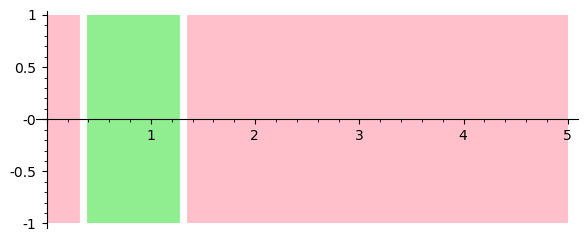

In [48]:
ctx_sig.refined_signal(4).plot()

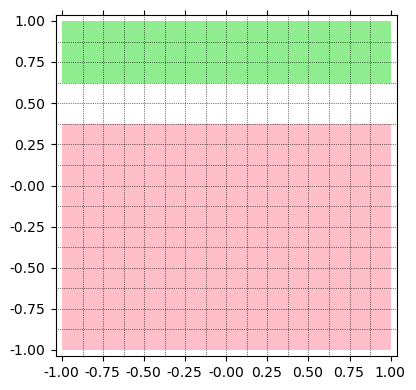

In [49]:
ctx_sig.plot_histogram2d(4)

### Polynomial plot

In [50]:
#p + reach.sage_interval_plot('x', 'y',
#                             poly=(x - 1)^2 + y^2 - 0.2,
#                             aspect_ratio='automatic')

## Context

In [51]:
kwargs = dict(
    order=5, step=(0.01, 0.5),
    precondition=1,
    estimation=1e-3,
    integrationScheme=2,
    cutoff_threshold=1e-5,
    verbosity=0,
    epsilon_ctx=0.1,
#    symbolic_composition=True,
)
args = (s, 7)

In [52]:
"[0.05, 0.1] Whelk" >> G(RIF(0,0.2), P)

C([0.05, 0.1] Whelk, G([0.0000000000000000 .. 0.20000000000000002], Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)))

In [53]:
sig = ("[0.05, 0.1] Whelk" >> F(RIF(0,0.2), ~ P)
       ).signal_for_system(s, 10, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-rmfz4y32.py"' ...
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 103 flowpipes in 0.3665175080532208 sec
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.6000000000000

Computed 12 flowpipes in 0.05904511996777728 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94341dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 7 flowpipes in 0.03463786200154573 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 6 flowpipes in 0.036146650032605976 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.022791681985836476 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

Computed 3 flowpipes in 0.02366456197341904 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.016042681003455073 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943454c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 2 flowpipes in 0.02490997704444453 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

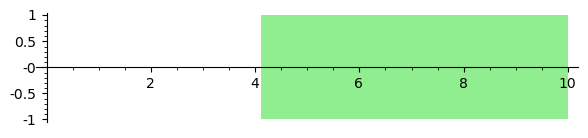

In [54]:
sig.plot()

In [55]:
sigM = ("[0.05, 0.1] Whelk" >> F(RIF(0,0.2), ~P)
       ).signal_for_system(s, 10, use_masks=True, **kwargs)
sigM

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-3xfce9mq.py"' ...
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 103 flowpipes in 0.40669792803237215 sec
mask = Mask([0.0000000000000000 .. 10.002000000000001], [[0.0000000000000000 .. 10.002000000000001]])
mask = Mask([0.0000000000000000 .. 10.002000000000001], [[0

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.6000000000000

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.059943911037407815 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.057954334013629705 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943443a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.06348669400904328 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.00

Computed 3 flowpipes in 0.03609175398014486 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 

Computed 3 flowpipes in 0.03182143101003021 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 

Computed 3 flowpipes in 0.021342189982533455 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0,

Computed 2 flowpipes in 0.03061708196764812 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 

Computed 2 flowpipes in 0.015447071986272931 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0,

Computed 2 flowpipes in 0.015646050975192338 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0,

Signal([0.0000000000000000 .. 10.000000000000000], [([0.0000000000000000 .. 0.078140625000000006], False), ([4.0633125000000003 .. 10.000000000000000], True)], mask=Mask([0.0000000000000000 .. 10.000000000000000], [[0.0000000000000000 .. 10.000000000000000]]))

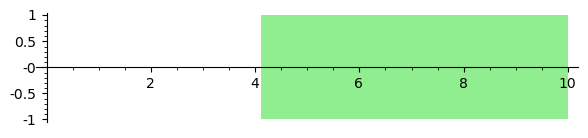

In [56]:
sigM.plot()

In [57]:
sigM.mask

Mask([0.0000000000000000 .. 10.000000000000000], [[0.0000000000000000 .. 10.000000000000000]])

In [58]:
%%time
sigG = G(RIF(10.2, 10.3), ("[0.05, 0.1] Whelk" >> F(RIF(0,0.2), ~P)),
         ).signal_for_system(s, 0, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-64782lzz.py"' ...
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 103 flowpipes in 0.4073230790672824 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 15 flowpipes in 0.07624353899154812 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roo

signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 9 flowpipes in 0.05345988896442577 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.2060000000000

Computed 8 flowpipes in 0.039981301000807434 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 6 flowpipes in 0.03159716899972409 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.027525893005076796 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 3 flowpipes in 0.02088200399884954 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.030422432988416404 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 2 flowpipes in 0.030673025001306087 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

In [59]:
sigG(0)

True

In [60]:
%%time
sigG = G(RIF(10.2, 10.3), ("[0.05,0.1] Whelk" >> F(RIF(0,0.2), ~P)),
         ).signal_for_system(s, 0, use_masks=True, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05,0.1] Whelk)" "/tmp/bond-sage-script-9yxd7nq7.py"' ...
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 103 flowpipes in 0.3797276940313168 sec
In G.signal
mask = Mask([0.0000000000000000 .. 10.302000000000002], [[10.199999999999999 .. 10.302000000000002]])
mask = Mask([0.0000000000000000 .. 10.30200000000

In [61]:
%%time
sigG = F(RIF(5, 5.1),
         "[1, 1.5] Lobster" >>
         G(RIF(10.2, 10.3),
           "[0.05, 0.1] Whelk" >>
            F(RIF(0,0.2), ~ P)),
         ).signal_for_system(s, 0, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([1, 1.5] Lobster)" "/tmp/bond-sage-script-sg9ezjk3.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000002]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999998 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999998 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-r3indp4t.py"' ...
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.6000000000000

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 11 flowpipes in 0.05885815399233252 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

Computed 8 flowpipes in 0.03801714698784053 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 6 flowpipes in 0.04466753196902573 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.020118076994549483 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d83a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Wh

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.04058103100396693 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 2 flowpipes in 0.021789175982121378 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.20599999999899998 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0

Computed 1 flowpipes in 0.009893688024021685 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 97 flowpipes in 0.3867620669770986 sec
In G.signal
mask = None

top-level root detection: 1 items in 0.11 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 14 flowpipes in 0.07325571501860395 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 11 flowpipes in 0.05990850098896772 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 7 flowpipes in 0.035388379998039454 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.04500319005455822 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.032188237993977964 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Wh

Computed 3 flowpipes in 0.01974302699090913 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.015887492976617068 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 2 flowpipes in 0.030390236992388964 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943443a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 110 flowpipes in 0.4884961069910787 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0,

Computed 15 flowpipes in 0.06516896898392588 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 12 flowpipes in 0.08541967399651185 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.06702263397164643 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Wh

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.022168555995449424 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

Computed 3 flowpipes in 0.023312212026212364 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.021249788987915963 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.022514270967803895 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Wh

Computed 2 flowpipes in 0.028242678032256663 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.053870067989919335 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

Computed 7 flowpipes in 0.05783741897903383 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 6 flowpipes in 0.03225870797177777 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 5 flowpipes in 0.03261580894468352 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 4 flowpipes in 0.0264029799727723 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.018968484015204012 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 3 flowpipes in 0.03863259102217853 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.018087922013364732 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 2 flowpipes in 0.03144840698223561 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.01705761899938807 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.

In [62]:
%%time
sigG = F(RIF(5, 5.1),
         "[1, 1.5] Whelk" >>
         G(RIF(10.2, 10.3),
           "[0.05, 0.1] Whelk" >>
            F(RIF(0,0.2), ~ P)),
         ).signal_for_system(s, 0, use_masks=True, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([1, 1.5] Whelk)" "/tmp/bond-sage-script-4rb26mo5.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000002]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999998 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999998 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-d76cs1i3.py"' ...
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^

In [63]:
%%time
sigG = G(RIF(2, 2.5),
         "[0.1, 0.2] Whelk" >>
         F(RIF(5, 5.1),
           "[1, 1.5] Lobster" >>
           G(RIF(10.2, 10.3),
             "[0.05, 0.1] Whelk" >>
             F(RIF(0,0.2), ~ P))),
         ).signal_for_system(s, 0, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.1, 0.2] Whelk)" "/tmp/bond-sage-script-m1_85m02.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000002]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999998 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999998 .. 0.8]); }) || ([1, 1.5] Lobster)" "/tmp/bond-sage-script-5glk2_zk.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000003]); dieWhelk || beLobster at rate RRPredation([0

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.099999999999999866 .. 0.20000000000000040]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.099999999999999866 .. 0.20000000000000040]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.099999999999999866 .. 0.20000000000000040]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.6000000000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 124 flowpipes in 0.750514944025781 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.30000

Computed 15 flowpipes in 0.11413280200213194 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 11 flowpipes in 0.05068389402003959 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.044055369042325765 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 6 flowpipes in 0.03557674103649333 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.04048897896427661 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.028314822993706912 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 3 flowpipes in 0.030759418033994734 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.028185336966998875 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.01748043904080987 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.029863141011446714 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.055167233978863806 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 9 flowpipes in 0.06214741000439972 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 7 flowpipes in 0.03635310003301129 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 6 flowpipes in 0.032694238994736224 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 5 flowpipes in 0.028102155949454755 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.034473034960683435 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.02112197899259627 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.014661424036603421 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.02559763699537143 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.020731005002744496 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 103 flowpipes in 0.49011648702435195 sec
In G.signal
mask = No

top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 14 flowpipes in 0.08757910400163382 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 12 flowpipes in 0.05767028604168445 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 8 flowpipes in 0.0747282539959997 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.06486606498947367 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 5 flowpipes in 0.044588191027287394 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.022594659007154405 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

Computed 3 flowpipes in 0.02698035998037085 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 2 flowpipes in 0.03100141999311745 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.03540534997591749 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 89 flowpipes in 0.39459129696479067 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 15 flowpipes in 0.07942970906151459 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.00000000000

Computed 12 flowpipes in 0.08490046998485923 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 12 flowpipes in 0.07009154098341241 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 11 flowpipes in 0.05048847699072212 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 7 flowpipes in 0.03916457301238552 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 6 flowpipes in 0.03054507402703166 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 5 flowpipes in 0.040382051025517285 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.019825858995318413 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.02871774003142491 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 2 flowpipes in 0.018292626948095858 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.018965481023769826 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 6 flowpipes in 0.05039293394656852 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.044476025039330125 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 5 flowpipes in 0.026581145997624844 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 4 flowpipes in 0.03008698398480192 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.032977028051391244 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 3 flowpipes in 0.019935231015551835 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.01736338500631973 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 72 flowpipes in 0.2663376450072974 sec
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?

top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.0951740259770304 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 9 flowpipes in 0.056711221986915916 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.03103389503667131 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 6 flowpipes in 0.0464545669965446 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

Computed 3 flowpipes in 0.023236920998897403 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.028742953028995544 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.03243275301065296 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942184c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 2 flowpipes in 0.02138542098691687 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.02970006101531908 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=

Computed 2 flowpipes in 0.02020090800942853 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.08214836195111275 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 7 flowpipes in 0.06232194503536448 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 6 flowpipes in 0.05786004598485306 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 4 flowpipes in 0.03674987098202109 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=

Computed 3 flowpipes in 0.03668631397886202 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.03277232201071456 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.02660447300877422 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.03474353201454505 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.2059999999

Computed 2 flowpipes in 0.020149365009274334 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.20599999999899998 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0,

top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 9 flowpipes in 0.07858294999459758 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 9 flowpipes in 0.05068871204275638 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.04031228000530973 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.034564247995149344 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344700>, 0, symbolic_composition=False, symbolic_compos

Computed 5 flowpipes in 0.027143160987179726 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.020535658986773342 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.02012750500580296 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.026139187975786626 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.03846266499022022 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.2059999999

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.04607253399444744 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.2059999999

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 5 flowpipes in 0.040758148999884725 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.02991873596329242 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.01937887299573049 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.028639936004765332 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 2 flowpipes in 0.016184528009034693 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.028301134007051587 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.015726297977380455 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.06756774603854865 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 9 flowpipes in 0.0573595609748736 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

Computed 7 flowpipes in 0.0386109389946796 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

Computed 6 flowpipes in 0.06237013597274199 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 4 flowpipes in 0.04608664201805368 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942185e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.034071656002197415 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.030911324021872133 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.03329459700034931 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.023232102976180613 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.026046718005090952 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, ver

Computed 2 flowpipes in 0.020480065024457872 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 1 flowpipes in 0.019723122008144855 sec
PolyObserver(x0^2 + 

Computed 15 flowpipes in 0.08927283197408542 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 12 flowpipes in 0.08490480104228482 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 9 flowpipes in 0.04900099098449573 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 7 flowpipes in 0.06745788501575589 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.033131378004327416 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 5 flowpipes in 0.04123132396489382 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.031669662974309176 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 3 flowpipes in 0.04022399999666959 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.02895045100012794 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.021647536021191627 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.018953328020870686 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.035589592007454485 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 75 flowpipes in 0.3047638530260883 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.0668208600836806 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000

Computed 10 flowpipes in 0.047219541971571743 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 9 flowpipes in 0.05083489103708416 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 7 flowpipes in 0.03710962401237339 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 6 flowpipes in 0.03200615994865075 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.021718077012337744 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.03177267999853939 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.0386939809541218 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.022161919972859323 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 2 flowpipes in 0.018569688021671027 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.034268259012605995 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 47 flowpipes in 0.2252624169923365 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.04713328805519268 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000

Computed 6 flowpipes in 0.04114646703237668 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 5 flowpipes in 0.028986140969209373 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 3 flowpipes in 0.02406705799512565 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.025046657014172524 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.016886645986232907 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.017929101013578475 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943444c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

In [64]:
%%time
sigG = G(RIF(2, 2.5),
         "[0.1, 0.2] Whelk" >>
         F(RIF(5, 5.1),
           "[1, 1.5] Lobster" >>
           G(RIF(10.2, 10.3),
             "[0.05, 0.1] Whelk" >>
             F(RIF(0,0.2), ~P))),
         ).signal_for_system(s, 0, use_masks=True, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.1, 0.2] Whelk)" "/tmp/bond-sage-script-ymn_ibcv.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000002]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999998 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999998 .. 0.8]); }) || ([1, 1.5] Lobster)" "/tmp/bond-sage-script-8flaw1oe.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000003]); dieWhelk || beLobster at rate RRPredation([0

In [65]:
sigG(0)

True

In [66]:
sigG

Signal([0.0000000000000000 .. -0.0000000000000000], [([0.0000000000000000 .. -0.0000000000000000], True)], mask=Mask([0.0000000000000000 .. -0.0000000000000000], [[0.0000000000000000 .. -0.0000000000000000]]))

In [67]:
%%time
sigG = G(RIF(2, 2.5),
         "[0.1, 0.2] Whelk" >>
         F(RIF(5, 5.1),
           "[1, 1.5] Lobster" >>
           G(RIF(10.2, 10.3),
             "[0.05, 0.1] Whelk" >>
             F(RIF(0,0.2), ~P))),
         ).signal_for_system(s, 10, use_masks=False, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.1, 0.2] Whelk)" "/tmp/bond-sage-script-t6uyra6p.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000002]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999998 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999998 .. 0.8]); }) || ([1, 1.5] Lobster)" "/tmp/bond-sage-script-9ylf9ta0.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000003]); dieWhelk || beLobster at rate RRPredation([0

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.099999999999999866 .. 0.20000000000000040]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.099999999999999866 .. 0.20000000000000040]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.099999999999999866 .. 0.20000000000000040]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.6000000000000

Computed 123 flowpipes in 0.4672488879878074 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.

top-level root detection: 1 items in 0.10 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 15 flowpipes in 0.08706548903137445 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.058030388958286494 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpr

Computed 9 flowpipes in 0.05498389998683706 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.04826255596708506 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 5 flowpipes in 0.05701049300841987 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.024939031049143523 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.022595775953959674 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.023725532984826714 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 2 flowpipes in 0.0155225700000301 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.016029271006118506 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 103 flowpipes in 0.3792089690105058 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 14 flowpipes in 0.0628967410302721 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 9 flowpipes in 0.049110293039120734 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.05390268302289769 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942184c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 6 flowpipes in 0.029539286042563617 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 3 flowpipes in 0.03419688099529594 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.02647715201601386 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.028029730019625276 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

Computed 2 flowpipes in 0.028895975032355636 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.028356798051390797 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 14 flowpipes in 0.13226381497224793 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.07741729397093877 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 11 flowpipes in 0.05509920895565301 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 7 flowpipes in 0.04603677400154993 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.045718086999841034 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 3 flowpipes in 0.03324186796089634 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.030345676990691572 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.02572286198846996 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 2 flowpipes in 0.024010206980165094 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 14 flowpipes in 0.06738427199888974 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 12 flowpipes in 0.058400550042279065 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 11 flowpipes in 0.051294378004968166 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 8 flowpipes in 0.05405752203660086 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 6 flowpipes in 0.0354466270073317 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

Computed 6 flowpipes in 0.05323381000198424 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 3 flowpipes in 0.029961828025989234 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.02265227702446282 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 2 flowpipes in 0.030310826026834548 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.023875065031461418 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.022776596015319228 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.12500000000000000 .. 0.12500000000000000]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.12500000000000000 .. 0.12500000000000000]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.12500000000000000 .. 0.12500000000000000]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.042838869034312665 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 5 flowpipes in 0.03274997294647619 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.03588013298576698 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.2059999999

Computed 3 flowpipes in 0.023676154960412532 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.027694210992194712 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.018575973983388394 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool 

Computed 2 flowpipes in 0.03184957604389638 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 2 flowpipes in 0.017642961000092328 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.018264968995936215 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 1 flowpipes in 0.014724908978678286 sec
PolyObserver(x0^2 + 

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?

top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 13 flowpipes in 0.06746319297235459 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 9 flowpipes in 0.04442085005575791 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.04734895896399394 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.05278549698414281 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.024199897015932947 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.03286486299475655 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.03188198199495673 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.022308307990897447 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 116 flowpipes in 0.5097589420038275 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.

top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 15 flowpipes in 0.07660349999787286 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.05158638703869656 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.04283677303465083 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 7 flowpipes in 0.035982661007437855 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.0505095690023154 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.02335334796225652 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.2059999999

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 3 flowpipes in 0.03477908100467175 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.02005752397235483 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.01640201499685645 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verb

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.20599999999899998 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.016498885990586132 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.R

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.06923374603502452 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 9 flowpipes in 0.05872398603241891 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.04221497301477939 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.030381646007299423 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.043850034999195486 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942215e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.0423428540234454 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime

Computed 3 flowpipes in 0.02078136202180758 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.04126659402390942 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.029369920026510954 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 se

Computed 2 flowpipes in 0.029346242954488844 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 6 flowpipes in 0.030370819964446127 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 5 flowpipes in 0.054709982010535896 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 5 flowpipes in 0.04421670298324898 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.023401747981552035 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.026208470982965082 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.02185810898663476 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 2 flowpipes in 0.020193156029563397 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.018806521024089307 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 58 flowpipes in 0.2711236090399325 sec
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?

top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 11 flowpipes in 0.06034193595405668 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 9 flowpipes in 0.04274465196067467 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.2059999999

Computed 6 flowpipes in 0.03116163599770516 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.03135167498840019 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.01917200197931379 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.2059999999

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.026002928032539785 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

Computed 3 flowpipes in 0.02022102300543338 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.020150972006376833 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.023554561019409448 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 116 flowpipes in 0.6597720170393586 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.30

Computed 15 flowpipes in 0.07546466297935694 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 11 flowpipes in 0.052294649998657405 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000

Computed 8 flowpipes in 0.05316096398746595 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.04483717598486692 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 5 flowpipes in 0.030058349017053843 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.031525650003459305 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.03400593396509066 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.02256085502449423 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.018053837993647903 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.019890882016625255 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218a60>, 0, symbolic_composition=False, symbolic_composition_order

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?

Computed 15 flowpipes in 0.07787643297342584 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 11 flowpipes in 0.04937918303767219 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 8 flowpipes in 0.03878980298759416 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 6 flowpipes in 0.029206420993432403 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942215e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 5 flowpipes in 0.0339248480158858 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

Computed 3 flowpipes in 0.01869233004981652 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 3 flowpipes in 0.028964139986783266 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.034177953959442675 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.017576751008164138 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 15 flowpipes in 0.077660342969466 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999

top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 14 flowpipes in 0.0654174629598856 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.06274860701523721 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

Computed 8 flowpipes in 0.045491451979614794 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.054970350000075996 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 5 flowpipes in 0.030974949011579156 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.02856080501805991 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.026093512016814202 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d85e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 3 flowpipes in 0.0257859299890697 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

Computed 2 flowpipes in 0.026153365965001285 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.024119579000398517 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 10 flowpipes in 0.059988817025441676 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 s

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 8 flowpipes in 0.04722051997669041 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 8 flowpipes in 0.04523157101357356 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.03715935198124498 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.03723652596818283 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.04057970299618319 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.024755696998909116 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

Computed 3 flowpipes in 0.020050259947311133 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.02724073000717908 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94218940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.2059999999

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.015548621013294905 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

Computed 40 flowpipes in 0.12429705599788576 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.030949946027249098 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.00000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 4 flowpipes in 0.04084126005182043 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.019081556994933635 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 3 flowpipes in 0.021360768005251884 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.022520905011333525 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e941cd160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

Computed 3 flowpipes in 0.02006024803267792 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 2 flowpipes in 0.016266662976704538 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 2 flowpipes in 0.01670002902392298 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 24 flowpipes in 0.07950744300615042 sec
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [[1.0000000000000000 .. 1.5000000000000000], 0], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 75 flowpipes in 0.271603491040878 sec
In G.signal
mask = None
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 12 flowpipes in 0.06266507605323568 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 10 flowpipes in 0.0548211689456366 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprim

Computed 8 flowpipes in 0.03841929300688207 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e943445e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

Computed 8 flowpipes in 0.038704038015566766 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94344dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 6 flowpipes in 0.03151803801301867 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.60000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 5 flowpipes in 0.028466239979024976 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d84c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

Computed 3 flowpipes in 0.0340416930266656 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.025032619014382362 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.030900079000275582 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.028835980978328735 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.20599999999899998 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0,

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 5 flowpipes in 0.029216617986094207 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.020096075953915715 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

Computed 3 flowpipes in 0.019731223990675062 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94221700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.6000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 3 flowpipes in 0.020389411016367376 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942d8a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fpri

phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 2 flowpipes in 0.031491847010329366 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e942183a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.205999999

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.60000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whe

Computed 2 flowpipes in 0.021723105979617685 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7f9e94ce3b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.20599999999899998 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x1, x0}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1

In [68]:
%%time
sigG = G(RIF(2, 2.5),
         "[0.1, 0.2] Whelk" >>
         F(RIF(5, 5.1),
           "[1, 1.5] Lobster" >>
           G(RIF(10.2, 10.3),
             "[0.05, 0.1] Whelk" >>
             F(RIF(0,0.2), ~P))),
         ).signal_for_system(s, 10, use_masks=True, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.1, 0.2] Whelk)" "/tmp/bond-sage-script-p3qblti8.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000002]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999998 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999998 .. 0.8]); }) || ([1, 1.5] Lobster)" "/tmp/bond-sage-script-ua1q4_q1.py"' ...
Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000003]); dieWhelk || beLobster at rate RRPredation([0

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


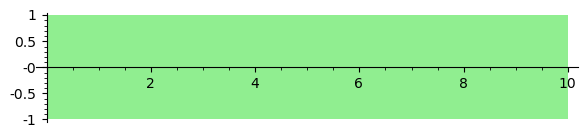

In [68]:
sigG.plot()

## Context signal (masked)

In [69]:
sigG = G(RIF(1, 1.1), ("[0.05, 0.1] Whelk" >> F(RIF(0,0.2), ~P)),
         ).signal_for_system(s, 10, use_masks=True, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-guhxucdb.py"' ...
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 105 flowpipes in 0.5311793350265361 sec
In G.signal
mask = Mask([0.0000000000000000 .. 11.102000000000003], [[1.0000000000000000 .. 11.102000000000003]])
mask = Mask([0.0000000000000000 .. 11.1020000000

Computed 12 flowpipes in 0.07453874198836274 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0ab2ab80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0,

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 7 flowpipes in 0.06170431000646204 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.00

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Computed 6 flowpipes in 0.038027534988941625 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0

Computed 3 flowpipes in 0.02080090800882317 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 

Computed 3 flowpipes in 0.033749740017810836 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0,

Computed 3 flowpipes in 0.027313143975334242 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bdc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0,

Computed 2 flowpipes in 0.020903994009131566 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0,

Computed 2 flowpipes in 0.03545338599360548 sec
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=Mask([0.0000000000000000 .. 0.20600000000000002], [[0.0000000000000000 .. 0.20600000000000002]]))
fprime = 0
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


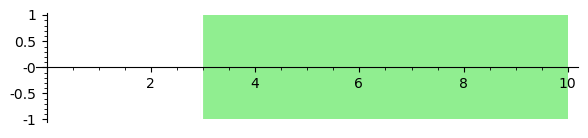

In [70]:
sigG.plot()

In [71]:
csigG = G(RIF(1, 1.1), ("[0.05, 0.1] Whelk" >> F(RIF(0,0.2), ~P)),
          ).context_signal_for_system(s, 10, use_masks=True, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-p5isn4s2.py"' ...
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function C.context_signal.<locals>.signal_fn at 0x7fdd09f98790>, reach_tree = <lbuc.reach_trees.ReachTree objec

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

contexts = ['[1.8136501665875138..4.519951383933971]', '[1.0461188510881052..1.495323977453862]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=Tr

(ContextSignal([0.0000000000000000 .. 0.0040000000000000001], [[0.94207049413012733 .. 3.7610080389889778], [1.0703372074438830 .. 1.5851040174800549]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09fa1fa0>)).to_domain(0.01?)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.11 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.075986046840315540 .. 1.9752177658655277], [1.1523956891309710 .. 1.5693674483709517]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterato

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.12 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.019944799683231539 .. 1.6169591171106475], [1.1625089536206030 .. 1.5341114627912223]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterato

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.08 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.12515599609624431 .. 1.2139046799925411], [1.1569216404697422 .. 1.4700834570577568]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterato

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.17692198176105823 .. 0.79682977499283881], [1.1422262956325559 .. 1.3653726338092494]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterat

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.18618731034472083 .. 0.58681887499823316], [1.1061140900802850 .. 1.2979957804825744]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09fbfd00>)).to_domain(0.01?)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
(ContextSignal([0.0000000000000000 .. 0.0040000000000000001], [[-0.18618731034472083 .. 0.58681887499823316], [1.1061140900802850 .. 1.2979957804825744]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09fbf220>)).to_domain(0.01?)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5970>
roots

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0554c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.16906995759619448 .. 0.42349148587084740], [1.0209175893760744 .. 1.2348700822418451]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterat

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5040>
roots

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb8580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


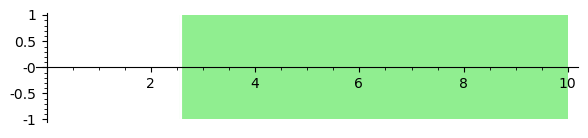

In [72]:
csigG.signal.plot()

 ==> creating ContextSignal with coord=(0,), signal = <function C.context_signal.<locals>.signal_fn at 0x7fdd09f98790>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fdd09f9de80>
mask = None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5c10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.06 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[2.6663856984758003 .. 5.

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5970>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.05 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.52850660856468223 .. 1.5061780832912164], [1.1737973229612754 .. 1.3773784870346857]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.08 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.0020721653647675919 .. 1.2565546507606098], [1.0896825203591149 .. 1.3640006866966945]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterat

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff56d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb82e0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

(ContextSignal([0.0000000000000000 .. 0.0040000000000000001], [[0.039436187441461711 .. 0.57287822256577615], [1.1153585010271056 .. 1.2590251049179391]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09f273d0>)).to_domain(0.01?)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompos

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5970>
roots

 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.03 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.042625138786530362 .. 0.40503357115034167], [1.0065391554304354 .. 1.2098575042557005]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09f17ee0>)).to_domain(0.01?)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
(ContextSignal([0.0000000000000000 .. 0.0040000000000000001], [[-0.042625138786530362 .. 0.40503357115034167], [1.0065391554304354 .. 1.2098575042557005]], [[-1 .. 1],

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5ac0>
 ==> 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bb80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5ac0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09fc0540>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.12135993621701970 .. 0.77598681642919476], [1.2138973963433530 .. 1.3832560327591439]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterato

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.011378309695116968 .. 0.60502728528982031], [1.1561273333867814 .. 1.3371223107663542]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5d60>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSi

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bdc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bdc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09fc0540>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.14503124999999994 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.14503124999999994 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.14503124999999994 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.14503124999999995], False), ([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.06 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.97468095407863564 .. 2.0965917348298917], [1.2389541298195319 .. 1.4637461660734972]], [[-1 .. 1],

top-level root detection: 1 items in 0.02 seconds
roots = [[0.10343749999999997 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.10343749999999997 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.10343749999999997 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.10343749999999998], False), ([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.06 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.79418284479427314 .. 1.8591164245311119], [1.2441712696462827 .. 1.4639919181507333]], [[-1 .. 1],

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.07 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.52836628686477526 .. 1.4470255743040271], [1.2478926466815156 .. 1.4523373576440244]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09fc0540>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181dc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5d60>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bdc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bdc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.05 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.027144788851155108 .. 0.50270513724210353], [1.1461377713088436 .. 1.2910412104091092]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09f0b790>)).to_domain(0.01?)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
(ContextSignal([0.0000000000000000 .. 0.0040000000000000001], [[-0.027144788851155108 .. 0.50270513724210353], [1.1461

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5820>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb82e0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09fc0540>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb82e0>
 ==> 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5d60>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.06 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002],

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ff5ac0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09fc0540>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

contexts = ['[-0.04201953088163837..0.49816951969569434]', '[1.2164599720999694..1.360564864988833]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditionin

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.03 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.083009179848304832 .. 0.37009053104160062], [1.1651090681625451 .. 1.2940289728358694]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09f53640>)).to_domain(0.01?)
 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.05 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.097301941068371742 .. 0.25834640330024567], [1.0908061154196777 .. 1.2161837772704334]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bdc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bdc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


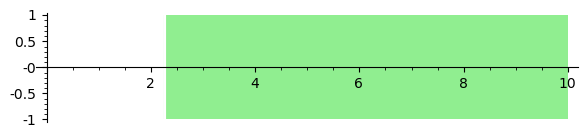

In [73]:
csigG.refined_signal(1).plot()

In [74]:
csigG = G(RIF(1, 1.1), ("[0.05, 0.1] Whelk" >> F(RIF(0,0.2), ~P)),
          ).context_signal_for_system(s, 10, use_masks=True, refine=1, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-b3t2fp6y.py"' ...
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function C.context_signal.<locals>.signal_fn at 0x7fdd09ee2280>, reach_tree = <lbuc.reach_trees.ReachTree objec

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb8ac0>
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=N

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb86d0>
 ==> 

top-level root detection: 1 items in 0.10 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.20 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.56435702356725603 .. 3.0799632350931039], [1.0976268897125998 .. 1.5950756861304166]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator

top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.16 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.30189275115173647 .. 2.4554123699411479], [1.1283276177975669 .. 1.5935980578055927]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Sig

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.08 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.096511287758240264 .. 1.3232769297386684], [1.1589429096318755 .. 1.4921175733184800]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterat

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.06 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.14063800527834478 .. 1.0176224981547005], [1.1582910974474587 .. 1.4252419917213144]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterato

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f57430>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000

top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

contexts = ['[-0.18618731034472083..0.5868188749982332]', '[1.1129736594475217..1.2979957804825744]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditionin

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb86d0>
roots

signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobste

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 

roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Si

signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00

=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d6d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask

roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.12500000000000000 .. 0.20599999999899999], True), ([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20599999999899999], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], True)], mask=N

 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precom

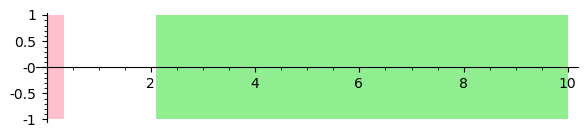

In [75]:
csigG.refined_signal(0).plot()

 ==> creating ContextSignal with coord=(0,), signal = <function C.context_signal.<locals>.signal_fn at 0x7fdd09ee2280>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fdd09ffc8b0>
mask = None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d2e0>
 ==> 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.04 seconds
roots = [[0.16076894219531240 .. 0.16076894219531266], [0.17090074868007798 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.16076894219531240 .. 0.16076894219531266], 
 [0.17090074868007798 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.16076894219531240 .. 0.16076894219531266], 
 [0.17090074868007798 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.16076894219531241], False), ([0.16076894219531265 .. 0.17090074868007799], False), ([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initi

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f39970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=N

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

top-level root detection: 1 items in 0.01 seconds
roots = [[0.062499999999999993 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.062499999999999993 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.062499999999999993 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.062499999999999994], False), ([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), sig

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f57430>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0040000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 =

roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Si

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e9a190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.00000000000000

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e9a580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.12500000000000000 .. 0.12500000000000000]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.12500000000000000 .. 0.12500000000000000]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.12500000000000000 .. 0.12500000000000000]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coo

contexts = ['[0.017513741883044887..0.5176273069304934]', '[1.1032864720734863..1.2441555661746941]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditionin

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.018369067671142852 .. 0.48238874271213989], [1.1032864720734862 .. 1.2344548102940290]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterat

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d040>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.00

roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = functools.partial(<bound method Atomic.signal_fn of At

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], True)], mask=None), reach_tre

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0063a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0063a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7fdd09e8d220>, ctx_mask=None
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b040>, 0, symbolic_composition=False, symbolic_composition_order=5,

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.011378309695116968 .. 0.84584863911876862], [1.1561273333867814 .. 1.3986898166164781]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 =

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a006700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

contexts = ['[0.02547011667049917..0.6050272852898203]', '[1.1780400735994525..1.3371223107663541]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning

statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
obs

roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.03 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.0070499022460565052 .. 0.52095585207906925], [1.1666580513694981 .. 1.3075760334713563]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09e8ca90>)).to_domain(0.01?)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
(ContextSignal([0.0000000000000000 .. 0.0040000000000000001], [[

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e9a970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], True)], mask=None),

 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.00000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a006a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a006a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.00

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.03 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.061253155605944993 .. 0.32004834216106765], [1.0896752709329955 .. 1.2189590444138217]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb8ac0>
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, c

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e9a430>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.06 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[0.090553764034604106 .. 0.81849219174087562], [1.2024972547596763 .. 1.3768476656804341]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterat

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

contexts = ['[0.05889254161183258..0.6873176113243612]', '[1.1923544130698347..1.3463619341267514]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a006b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a006b80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning

 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.001000000

top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [

res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d040>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0063a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0063a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb8ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.20599999999899998 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
ro

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f57d60>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.12500000000000000], [0.20599999999899998 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
ro

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f57970>
roots

res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f57d60>
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, c

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f57970>
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.010000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09eb06d0>
 ==> 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06ba60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09eb0970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000

roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = functools.partial(<bound method Atomic.signal_fn of Ato

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e40970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSignal([0.0000000000000000 .. 0.206000000

 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09f20c00>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f57c10>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.04 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.076840479862893080 .. 0.40899141002361789], [1.1771627102689090 .. 1.3122544483494523]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = [[0.0000000000000000 .. 0.12500000000000000], [0.20599999999899998 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.12500000000000000], 
 [0.20599999999899998 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.12500000000000000 .. 0.20599999999899999], True), ([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20599999999899999], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.00000

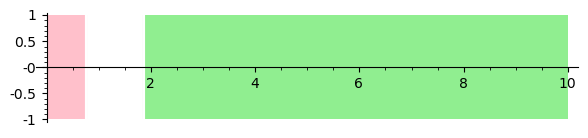

In [76]:
csigG.refined_signal(1).plot()

In [77]:
csigG = G(RIF(1, 1.1), ("[0.05, 0.1] Whelk" >> F(RIF(0,0.2), ~P)),
          ).context_signal_for_system(s, 10, use_masks=True, refine=2, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-de5xa9u6.py"' ...
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[4 .. 6], [0.99999999999999988 .. 1.2000000000000004]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function C.context_signal.<locals>.signal_fn at 0x7fdd09dcf0d0>, reach_tree = <lbuc.reach_trees.ReachTree objec

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.002000000000000

contexts = ['[2.906280067449446..6.000107635620549]', '[1.2952814926174452..1.5950756861304165]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=Tr

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


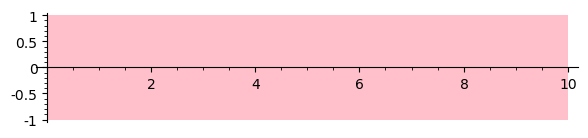

In [78]:
csigG.refined_signal(0).plot()

 ==> creating ContextSignal with coord=(0,), signal = <function C.context_signal.<locals>.signal_fn at 0x7fdd09dcf0d0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fdd09dc19a0>
mask = None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f396d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaa160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaa160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb8ac0>
 ==> 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaa3a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaa3a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaa4c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaa4c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d970>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaa700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaa700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaa940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaa940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaab80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaab80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a006dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a006dc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d820>
roots

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f396d0>
roots

/usr/lib64/python3.8/site-packages/sage/plot/contour_plot.py:203: UserWarning: No contour levels were found within the data range.
  CS = subplot.contour(self.xy_data_array, contours, cmap=cmap,


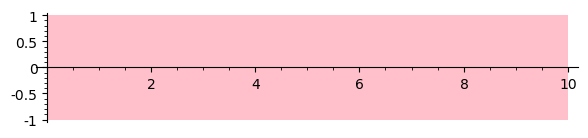

In [79]:
csigG.refined_signal(1).plot()

In [80]:
sf = m.process("[0, 1.5] Whelk || [0, 8] Lobster with network N(0.8, 0.6, 0.3, 0.05, 2)").as_system

Running cmd: 'savesage "[0, 1.5] Whelk || [0, 8] Lobster with network N(0.8, 0.6, 0.3, 0.05, 2)" "/tmp/bond-sage-script-d23l6vq1.py"' ...


In [81]:
csigGsf = G(RIF(1, 1.1), ("[0.05, 0.1] Whelk" >> F(RIF(0,0.2), ~P)),
          ).context_signal_for_system(sf, 10, use_masks=True, refine=2, **kwargs)

Running cmd: 'savesage "([1] Lobster || [1] Whelk || { growWhelk at rate NLGrowth([0.6 .. 0.6000000000000001]); dieWhelk || beLobster at rate RRPredation([0.3 .. 0.30000000000000004], [0.7999999999999999 .. 0.8]); dieLobster at rate NLDecay([4.9999999999999996e-2 .. 5.0e-2]); beWhelk || growLobster at rate RRPredation(2.0, [0.7999999999999999 .. 0.8]); }) || ([0.05, 0.1] Whelk)" "/tmp/bond-sage-script-310gx5l_.py"' ...
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [[0 .. 8], [0.0000000000000000 .. 1.5000000000000000]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.2400000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function C.context_signal.<locals>.signal_fn at 0x7fdd09d7a3a0>, reach_tree = <lbuc.reach_trees.ReachTree object

 ==> creating ContextSignal with coord=(0, 0), signal = <function C.context_signal.<locals>.signal_fn at 0x7fdd09dcf0d0>, reach_tree = None, ctx_mask=<lbuc.context_masks.ContextMask object at 0x7fdd09d57a30>
mask = None
phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ct

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e9aeb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], []

fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ea6190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None)

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a006b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a006b80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09de9820>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaa280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaa280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaaca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaaca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaadc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaadc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f2d2e0>
roots

res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaaee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d26820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 =

top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.16 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.018208844048036494 .. 4.2501076356205490], [0.99926115061068132 .. 1.2947505684892849]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaadc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09fb8190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask

top-level root detection: 1 items in 0.09 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.17 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.016724910145213691 .. 4.5001076356205490], [0.99937749874630554 .. 1.2956831404100584]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

top-level root detection: 1 items in 0.02 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09eaa4c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaa4c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f396d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .

top-level root detection: 1 items in 0.07 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.15 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.024383478487889986 .. 4.5001076356205490], [0.99906085260944788 .. 1.3284731528393768]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaaca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d06970>
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=N

roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=No

top-level root detection: 1 items in 0.08 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.15 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.018699399828518048 .. 4.7501076356205490], [0.99934789526256007 .. 1.3115716475258406]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildItera

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09eaadc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d26eb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09de9ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09cce6d0>
roots

res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09deeb80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d37eb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 =

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09deeca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09deeca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=No

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09deedc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09deedc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09f57190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=Non

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d37d60>
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.06 seconds
(ContextSignal([0.0000000000000000 .. 0.20600000000000002], [[-0.031243176265112062 .. 4.7501076356205490], [0.99884857757303058 .. 1.3628611321473679]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7fdd09d20c70>)).to_domain(0.01?)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
(ContextSignal([0.0000000000000000 .. 0.0040000000000000001], [[-0.031243176265112062 .. 4.750107635620

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e40820>
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=N

roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.000000

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d37580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd55e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd55e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d37c10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None)

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d37820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5b80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e40820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee4c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee4c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09d37970>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5dc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09d05160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09d05160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09d053a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09d053a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ea6190>
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09e9a430>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09d055e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09de9820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.

roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSigna

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09d05ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09d05ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09dee3a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd55e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd55e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09d055e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09d055e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce5160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce5280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ca22e0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09d05700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09d05700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd55e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd55e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.002000000000000

 ==> creating ContextSignal with coord=(3, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7fdd09c95670>, ctx_mask=None
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce53a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.800000

var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd09ca2ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce5820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), rea

roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.01000

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a2016d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=Non

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055dc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=No

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a339eb0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.002000000000000

setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a255820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002

 ==> creating ContextSignal with coord=(0, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7fdd0a021a60>, ctx_mask=None
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.800000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055dc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055820>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181dc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0b26fd60>
roots

statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
obs

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a181a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a181a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a201580>
 ==> 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b4c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b4c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a339eb0>
roots

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

contexts = ['[2.610904283877958..5.250107635620549]', '[0.9991319700257814..1.181337218815075]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=Tru

top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b280>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b280>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a201d60>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a29fc10>
roots

contexts = ['[-0.03182390324062846..2.7341418661899604]', '[1.1904578457703043..1.3818355750224391]']
statics  = ['[0.0499999999999996..0.10000000000000009]']
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditionin

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0555e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0555e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = functools.partial(<bound method Atomic

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a3dceb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.002000000000000

 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity

seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.2000000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a255820>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a29fc10>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a2eb040>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a339d60>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0b236580>
roots

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a339040>
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integra

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0ab2aee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0ab2aee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0b3b7580>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a3052e0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0b26feb0>
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5820>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a4cc6d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=Non

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd54c0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd54c0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a42b190>
roots

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a255970>
roots

domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), s

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a29fac0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce5160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000000000 .. 0.0020000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7fdd0a154700>, ctx_mask=None
recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0,

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce53a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce53a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a6e2040>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce5a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.002000000000000

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a201eb0>
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with co

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5b80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a255820>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a255820>
roots

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce5ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce5dc0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5dc0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a7412e0>
roots

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09ce5ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09ce5ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a305430>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0b26feb0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0b001040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0b001040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), sig

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06b5e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a2ebeb0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5b80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a3052e0>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0b001040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0b001040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0b3b7970>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0b0015e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0b0015e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a93feb0>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0b001940>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0b001940>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a42b2e0>
roots

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5a60>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5a60>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a29fc10>
roots

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0b001040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a9e5ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=Non

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0b001ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0aa3beb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0b001ca0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0b001ca0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a42b040>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0b0015e0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0b0015e0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a2ebd60>
roots

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.0000000000000000 .. 0.0060000000000000054], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [([0.0000000000000000 .. 0.0040000000000000001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [([0.0000000000

phi variables sfs = {x0, x1}
system sfs = System(R, (x0, x1), [0, [0.049999999999999600 .. 0.10000000000000009]], (-2*x0*x1^2 - 0.05000000000000000?*x0^2 + 1.600000000000000?*x0*x1 - 0.05000000000000000?*x0, 0.3000000000000000?*x0*x1^2 - 0.240000000000000?*x0*x1 - 0.600000000000000?*x1^2 + 0.600000000000000?*x1), varmap=bidict({'Lobster': x0, 'Whelk': x1}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(Lobster^2 + (Whelk - 1)^2 > 0.200000000000000)>, precompose_systems=False, order=5, step=(0.0100000000000000, 0.500000000000000), precondition=1, estimation=0.00100000000000000, integrationScheme=2, cutoff_threshold=0.0000100000000000000, verbosity=0, epsilon_ctx=0.100000000000000, instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7fdd09edc4c0>, print_timings=False, initial_form=<InitialForm.SPLIT_VARS: 3>, unpreconditioning_order=5), reach_tree = <lbuc.reach_t

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5ee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5ee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a305430>
roots

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0aa3a040>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0aa3a040>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a774eb0>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0aa3a160>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0aa3a160>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 0.0020000000000000001], [], mask=None), reach_tree = None, ctx_mask

top-level root detection: 1 items in 0.06 seconds
roots = [[0.0000000000000000 .. 0.20599999999900002]]
domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
seg_domain = [0.0000000000000000 .. 0.20600000000000002]
roots = [[0.0000000000000000 .. 0.20599999999900002]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [([0.20599999999900001 .. 0.20600000000000002], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.20600000000000002], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.0040000000000000001], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.002000000000000

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd09cd5b80>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd09cd5b80>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0b3b7580>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a055700>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a055700>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a06bee0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fdd0a339040>
roots

recomputing reachset
PolyObserver(x0^2 + x1^2 - 2*x1 + 0.8000000000000000?, <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, 0, symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x0', b'x1']
res = b'(([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2))'
var_names = [b'local_t', b'x0', b'x1']
res = b''
PolyObserver((([0.7999999999 , 0.8000000001]) + ([-2.0000000000 , -2.0000000000] * x1) + ([1.0000000000 , 1.0000000000] * x1^2) + ([1.0000000000 , 1.0000000000] * x0^2)), <flowstar.reachability.Reach object at 0x7fdd0a0553a0>, , symbolic_composition=False, symbolic_composition_order=5, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x0', b'x1']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 

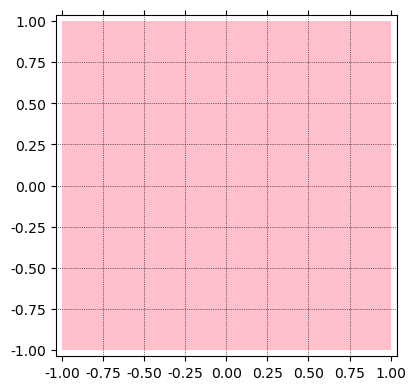

In [82]:
csigG.plot_histogram2d(3)

## Differential Context

In [ ]:
{x: RIF(6,7)} % G(RIF(0,0.2), P)

In [ ]:
# Use symbolic remainders for context jump 
kwargs['integrationScheme'] = 7

In [ ]:
kwargs['verbosity'] = 10

In [ ]:
kwargs['symbolic_composition'] = True

In [ ]:
sig = ({x: RIF(6)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
sig = ({x: RIF(6, 6.1)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
sig = ({x: RIF(10, 10.05)} % G(RIF(0,0.2), P)
       ).signal_for_system(vf, v3, 2*pi, **kwargs)

In [ ]:
sig.plot()

In [ ]:
{x: 1, y: 2}

In [ ]:
kxs = [[('x', RIF(1,2)), ('y', RIF(5,6))], [('x', RIF(2,3)), ('y', RIF(6,7))], [('x', RIF(1,2)), ('y', RIF(5,6))], [('x', RIF(2,3)), ('y', RIF(6,7))]]

In [ ]:
sorted(kxs)

In [ ]:
sorted(kxs,
       key=lambda xs: [(k, x.endpoints()) for k, x in xs])